#**Project 1**
*IE 6400 Foundations Data Analytics Eng*

##**Group 8**

```
1.   Mahrukh Malik
2.   Sumanth Wannur
3.   Gopichand Kandikonda
```

##**Task 1**

This task involves analyzing eight datasets, each containing data points and their respective class information.

To start with, we implemented K-means and hierarchical clustering methods to generate clusters for each dataset. To determine the number of clusters, we evaluated the optimal number of clusters using internal validation metrics, which provided insights into the quality of the clustering results for a range of clusters.

To visualize the clustering results, we plotted the data points for each dataset in 2D or 3D and colored them according to their original class and the class allocated by the clustering algorithm, to understand the distribution of data points and their respective classes and to visualize how the clustering algorithm performed in assigning data points to their respective clusters.

In [3]:
# Installing libraries
!pip install validclust
!pip install scikit-learn==0.22.2.post1
!pip install chardet
!pip install hdbscan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scikit-learn-0.22.2.post1.tar.gz (6.9 MB)
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-learn: filename=scikit_learn-0.22.2.post1-cp39-cp39-linux_x86_64.whl size=23570480 sha256=8929f48f19e46ff6cd36998da28d2d0808466434033e974f5000a5f0b4acf012
  Stored in directory: /root/.cache/pip/wheels/f0/8b/2a/7e1e1a081fbbd083335a795448aca004ad4736ef1d7d4ae062
Successfully built scikit-learn
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.5 requires scikit-

In [4]:
# Importing relevant packages
import pandas as pd
import numpy as np
from google.colab import files, drive
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn import metrics
from sklearn.metrics import accuracy_score, pairwise_distances, f1_score, silhouette_samples, silhouette_score, confusion_matrix, adjusted_rand_score, normalized_mutual_info_score, fowlkes_mallows_score, calinski_harabasz_score, mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from validclust import dunn
from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import SequentialFeatureSelector as SFS, ExhaustiveFeatureSelector as EFS
from sklearn.model_selection import train_test_split
import warnings
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import chardet
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from sklearn.cluster import DBSCAN
import hdbscan
from mpl_toolkits.mplot3d import Axes3D
import os.path

/usr/local/lib/python3.9/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


##**Project Task 1**

###**Uploading Data**

In [5]:
# List of CSV files to read and process
data_files = []

# uploading 8 files from user's local machine to the notebook's runtime environment
uploaded = files.upload()
for filename in uploaded.keys():
    print(f"Uploaded file: {filename} with length {len(uploaded[filename])} bytes")
    data_files.append(filename)

Saving Data8.csv to Data8.csv
Saving Data7.csv to Data7.csv
Saving Data6.csv to Data6.csv
Saving Data5.csv to Data5.csv
Saving Data4.csv to Data4.csv
Saving Data3.csv to Data3.csv
Saving Data2.csv to Data2.csv
Saving Data1.csv to Data1.csv
Uploaded file: Data8.csv with length 149269 bytes
Uploaded file: Data7.csv with length 21212 bytes
Uploaded file: Data6.csv with length 114186 bytes
Uploaded file: Data5.csv with length 29989 bytes
Uploaded file: Data4.csv with length 28975 bytes
Uploaded file: Data3.csv with length 14857 bytes
Uploaded file: Data2.csv with length 18151 bytes
Uploaded file: Data1.csv with length 7798 bytes


In [6]:
# Create an empty dictionary to store the processed dataframes
data_dict = {}
data_info = []  # empty list to store data name and shape pairs

# Loop through each file, read it into a dataframe, and process the 'Class' column
for i, file_name in enumerate(data_files):
    df = pd.read_csv(file_name, index_col=0)

    # Subtract 1 from the 'Class' column if it is not already 0 to align the class labels with the indexing used by k-means clustering
    df['Class'] = np.where(df['Class'] == 0, 0, df['Class'] - 1).astype(int)

    # Store the processed dataframe in the dictionary with a key based on the file name
    data_dict[file_name.lower().replace(".csv", "")] = df

    # Print the shape of the resulting dataframe, along with the dimensions
    if df.shape[1] == 4:
        print(f"Processed file '{file_name}', shape: {df.shape}, dimensions: 3D")
        data_info.append((file_name, "3D"))
    else:
        print(f"Processed file '{file_name}', shape: {df.shape}, dimensions: 2D")
        data_info.append((file_name, "2D"))

# Convert the data_info list to a dataframe and set the column names
data_info_df = pd.DataFrame(data_info, columns=["Data Name", "Data Shape"])


Processed file 'Data8.csv', shape: (4002, 4), dimensions: 3D
Processed file 'Data7.csv', shape: (770, 3), dimensions: 2D
Processed file 'Data6.csv', shape: (4096, 3), dimensions: 2D
Processed file 'Data5.csv', shape: (800, 4), dimensions: 3D
Processed file 'Data4.csv', shape: (1000, 4), dimensions: 3D
Processed file 'Data3.csv', shape: (400, 4), dimensions: 3D
Processed file 'Data2.csv', shape: (404, 4), dimensions: 3D
Processed file 'Data1.csv', shape: (212, 4), dimensions: 3D


###**Defining Functions**

We are defining six functions, each of which performs a specific clustering or plotting task on a given dataset.

In [69]:
def k_means_clustering_scores(df):
    # Check if the dataframe has a column named "Hierarchy Class" to determine the number of columns to use
    if "Hierarchy Class" in df.columns:
        num_columns = df.shape[1] - 2
    else:
        num_columns = df.shape[1] - 1
    
    # Check if the number of columns is 2 or 3, since this function is designed for 2D or 3D data only
    if num_columns == 2 or num_columns == 3:
    
        min_clusters = 1
        max_clusters = 10
        
        # Initialize lists to store scores for each number of clusters
        inertias = []
        silhouette_scores = []
        ch_scores = []
        within_cluster_distances = []

        # Calculate scores for k=1 separately and append to corresponding lists, as silhouette score and Calinski Harabasz score can not be computed for single cluster
        kmeans = KMeans(n_clusters=1, init='k-means++', max_iter=300, n_init=10, random_state=0)
        kmeans.fit(df.iloc[:, :num_columns])
        data_inertia = kmeans.inertia_
        data_labels = kmeans.labels_
        within_cluster_distance = kmeans.transform(df.iloc[:, :num_columns]).min(axis=1).sum()
        within_cluster_distances.append(within_cluster_distance)
        inertias.append(data_inertia)

        kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
        kmeans.fit(df.iloc[:, :num_columns])
        data_labels = kmeans.labels_
        data_silhouette_score = silhouette_score(df.iloc[:, :num_columns], data_labels)
        data_ch_score = calinski_harabasz_score(df.iloc[:, :num_columns], data_labels)
        silhouette_scores.append(data_silhouette_score)
        ch_scores.append(data_ch_score)

        # Loop through each number of clusters from 2 to max_clusters and calculate scores for each
        for num_clusters in range(2, max_clusters+1):
            kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
            kmeans.fit(df.iloc[:, :num_columns])
            data_inertia = kmeans.inertia_
            data_labels = kmeans.labels_
            within_cluster_distance = kmeans.transform(df.iloc[:, :num_columns]).min(axis=1).sum()
            
            # Append scores for current number of clusters to corresponding lists
            within_cluster_distances.append(within_cluster_distance)
            inertias.append(data_inertia)

            data_silhouette_score = silhouette_score(df.iloc[:, :num_columns], data_labels)
            data_ch_score = calinski_harabasz_score(df.iloc[:, :num_columns], data_labels)

            silhouette_scores.append(data_silhouette_score)
            ch_scores.append(data_ch_score)
        
       
        # plot elbow method
        fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
        axs[0].plot(range(min_clusters, max_clusters+1), inertias, marker='o')
        axs[0].set_xlabel('Number of clusters')
        axs[0].set_ylabel('Inertia')
        axs[0].set_title('Elbow Method')

        # plot silhouette coefficient
        axs[1].plot(range(min_clusters, max_clusters+1), silhouette_scores, marker='o')
        axs[1].set_xlabel('Number of clusters')
        axs[1].set_ylabel('Silhouette Coefficient')
        axs[1].set_title('Silhouette Coefficient')


        # plot within cluster distances
        axs[2].plot(range(min_clusters, max_clusters+1), within_cluster_distances, marker='o')
        axs[2].set_xlabel('Number of clusters')
        axs[2].set_ylabel('Within Cluster Distance')
        axs[2].set_title('Within Cluster Distance')

        # plot Calinski Harabasz score
        axs[3].plot(range(min_clusters, max_clusters+1), ch_scores, marker='o')
        axs[3].set_xlabel('Number of clusters')
        axs[3].set_ylabel('Calinski Harabasz score')
        axs[3].set_title('Calinski Harabasz score')

    
    else:
        raise ValueError("Invalid dataset shape. Expected 2D or 3D data.")


In [64]:
def k_means_clustering(df, num_clusters):
    
    # Check if "Hierarchy Class" column exists in the dataset
    if "Hierarchy Class" in df.columns:
        # Get the number of columns in the dataset, excluding the "Class" and "Hierarchy Class" columns
        num_columns = df.shape[1] - 2
    else:
        # Get the number of columns in the dataset, excluding the "Class" column
        num_columns = df.shape[1] - 1
    
    # Check if the dataset has 2 or 3 dimensions
    if num_columns == 2 or num_columns == 3:
        
        # Get the number of clusters by counting the unique values in the "Class" column
        num_clusters = num_clusters
        
        # Create a KMeans object with the specified number of clusters and random_state=0
        kmeans = KMeans(n_clusters=num_clusters, random_state=0)
        
        # Fit the KMeans object to the dataset
        kmeans.fit(df.iloc[:, :num_columns])
        
        # Compute the inertia, cluster centers, and cluster labels
        data_inertia, data_clustercenters, data_labels = kmeans.inertia_, kmeans.cluster_centers_, kmeans.labels_
        
        # Add a new column 'K-Means Class' to the input data and assign the obtained labels to it
        df['K-Means Class'] = data_labels

        # Return the inertia, cluster centers, and cluster labels as a tuple
        return data_inertia, data_clustercenters, data_labels, df
    
    # If the dataset has a number of dimensions other than 2 or 3, print an error message
    else:
        raise ValueError("Invalid dataset shape. Expected 2D or 3D data.")


In [65]:
def hierarchy_clustering(df, num_clusters):

    # Check if the "K-Means Class" column exists in the dataframe
    if "K-Means Class" in df.columns:
        # Get the number of columns in the dataset, excluding the "Class" and "K-Means Class" columns
        num_columns = df.shape[1] - 2
    else:
        # Get the number of columns in the dataset, excluding the "Class" column
        num_columns = df.shape[1] - 1
    
    # Check if the dataset has 2 or 3 dimensions
    if num_columns == 2 or num_columns == 3:

        # Get the number of clusters by counting the unique values in the "Class" column
        num_clusters = num_clusters

        # Create a hierarchical clustering object with the specified number of clusters and linkage='ward'
        h_clustering = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')

        # Fit the clustering object to the dataset
        h_clustering.fit(df.iloc[:, :num_columns])

        # Add a new column 'Hierarchy Class' to the input data and assign the obtained labels to it
        df['Hierarchy Class'] = h_clustering.labels_

        # Return cluster labels and df
        return h_clustering.labels_, df
    
    else:
        raise ValueError("Invalid dataset shape. Expected 2D or 3D data.")

In [66]:
def original_graph(data):
    # Extract the first, second and second-last columns of the dataframe into variables x, y and label respectively
    x = data.iloc[:, 0]
    y = data.iloc[:, 1]
    label = data.loc[:, 'Class']

    # Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
    fig, ax = plt.subplots(figsize=(10, 8))

    # Remove axis lines and markings for 3D graph
    if data.shape[1] == 6:
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Create a dictionary named 'plot_settings' to store various plot settings
    plot_settings = {
        'c': label,
        'cmap': 'plasma',
        'alpha': 1,
        's': 15
    }

    # Check if the number of columns in the dataframe is 6
    if data.shape[1] == 6:
        # Extract the third column of the dataframe into a variable named z
        z = data.iloc[:, 2]
        # Create a 3D subplot and store the axes object in variable ax
        ax = fig.add_subplot(projection='3d')
        # Plot a 3D scatter plot with x, y and z coordinates, using the plot_settings dictionary
        ax.scatter(x, y, z, **plot_settings)
        # Set the label for the z-axis to "X3"
        ax.set_zlabel("X3", labelpad=10)

    # Check if the number of columns in the dataframe is 5
    elif data.shape[1] == 5:
        # Plot a 2D scatter plot with x and y coordinates, using the plot_settings dictionary
        ax.scatter(x, y, **plot_settings)

    # # Set the label for the x-axis to "X1", y-axis to "X2", and title of the plot to "Graph of Original Class"
    ax.set_xlabel("X1", labelpad=10)
    ax.set_ylabel("X2", labelpad=10)
    ax.set_title("Plot of Original Class Clusters")

    # Display the plot
    plt.show()


In [67]:
def kmean_graph(data):
    # Extract the first, second and second-last columns of the dataframe into variables x, y and label respectively
    x = data.iloc[:, 0]
    y = data.iloc[:, 1]
    label = data.loc[:, 'K-Means Class']

    # Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
    fig, ax = plt.subplots(figsize=(10, 8))

    # Remove axis lines and markings for 3D graph
    if data.shape[1] == 6:
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Create a dictionary named 'plot_settings' to store various plot settings
    plot_settings = {
        'c': label,
        'cmap': 'plasma',
        'alpha': 1,
        's': 15
    }

    # Check if the number of columns in the dataframe is 6
    if data.shape[1] == 6:
        # Extract the third column of the dataframe into a variable named z
        z = data.iloc[:, 2]
        # Create a 3D subplot and store the axes object in variable ax
        ax = fig.add_subplot(projection='3d')
        # Plot a 3D scatter plot with x, y and z coordinates, using the plot_settings dictionary
        ax.scatter(x, y, z, **plot_settings)
        # Set the label for the z-axis to "X3"
        ax.set_zlabel("X3", labelpad=10)

    # Check if the number of columns in the dataframe is 5
    elif data.shape[1] == 5:
        # Plot a 2D scatter plot with x and y coordinates, using the plot_settings dictionary
        ax.scatter(x, y, **plot_settings)

    # # Set the label for the x-axis to "X1", y-axis to "X2", and title of the plot to "Graph of Original Class"
    ax.set_xlabel("X1", labelpad=10)
    ax.set_ylabel("X2", labelpad=10)
    ax.set_title("Plot of K-Means Class Clusters")

    # Display the plot
    plt.show()



In [68]:
def hierarchy_graph(data):
    # Extract the first, second and second-last columns of the dataframe into variables x, y and label respectively
    x = data.iloc[:, 0]
    y = data.iloc[:, 1]
    label = data.loc[:, 'Hierarchy Class']

    # Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
    fig, ax = plt.subplots(figsize=(10, 8))

    # Remove axis lines and markings for 3D graph
    if data.shape[1] == 6:
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Create a dictionary named 'plot_settings' to store various plot settings
    plot_settings = {
        'c': label,
        'cmap': 'plasma',
        'alpha': 1,
        's': 15
    }

    # Check if the number of columns in the dataframe is 6
    if data.shape[1] == 6:
        # Extract the third column of the dataframe into a variable named z
        z = data.iloc[:, 2]
        # Create a 3D subplot and store the axes object in variable ax
        ax = fig.add_subplot(projection='3d')
        # Plot a 3D scatter plot with x, y and z coordinates, using the plot_settings dictionary
        ax.scatter(x, y, z, **plot_settings)
        # Set the label for the z-axis to "X3"
        ax.set_zlabel("X3", labelpad=10)

    # Check if the number of columns in the dataframe is 5
    elif data.shape[1] == 5:
        # Plot a 2D scatter plot with x and y coordinates, using the plot_settings dictionary
        ax.scatter(x, y, **plot_settings)

    # # Set the label for the x-axis to "X1", y-axis to "X2", and title of the plot to "Graph of Original Class"
    ax.set_xlabel("X1", labelpad=10)
    ax.set_ylabel("X2", labelpad=10)
    ax.set_title("Plot of Hierarchical Class Clusters")

    # Display the plot
    plt.show()

##**Analysis of Data 1**

In [70]:
data_dict['data1']

,X1,X2,X3,Class
1,-0.063274,0.027734,0.022683,0
2,-0.000731,0.048211,0.069198,0
3,-0.060767,-0.009080,0.053085,0
4,0.013252,-0.011876,0.055324,0
5,-0.054508,-0.003813,0.001738,0
...,...,...,...,...
208,0.175738,-0.053478,-2.733752,6
209,0.396046,-0.858377,-3.126866,6
210,-0.406362,-0.334541,-2.885598,6
211,-0.299275,0.071281,-3.642585,6


###**K-Mean Clustering of Data 1**

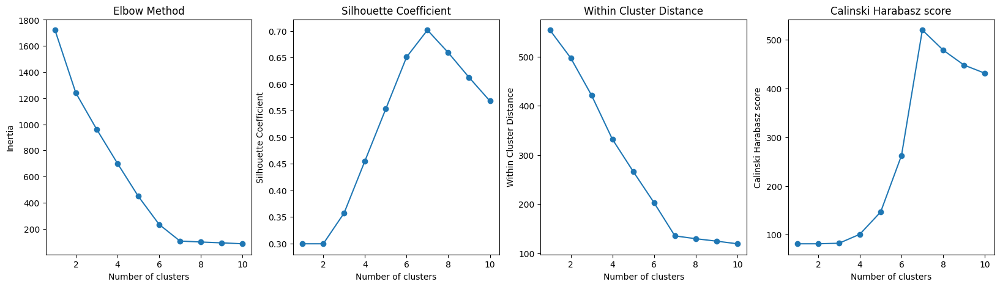

In [71]:
# Check if the 'K-Means Class' column already exists in the 'data1' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data1'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data1' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data1'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data1' dataframe
    del data_dict['data1']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data1' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data1'])

Based on the provided internal validation analysis scores for KMeans clustering, 7 clusters is the clear choice for the optimal number of clusters.

The Calinski Harabasz Score seems to suggest that 7 clusters may be optimal, as it has the highest score value, which indicates better cluster separation. The Within Cluster Distance also decreases rapidly when the number of clusters is increased from 2 to 7, and the decrease becomes much slower beyond 7 clusters.

Additionally, the Silhouette Score reaches its peak value at 7 clusters.

Therefore, based on these results, it may be reasonable to select 7 clusters as the optimal number, depending on the specific goals and requirements of the analysis.

In [72]:
# Check if the 'K-Means Class' column already exists in the 'data1' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data1'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data1' dataframe
    data1_opt_inertia, data1_opt_cluster_centers, data1_opt_labels, data_dict['data1'] = k_means_clustering(data_dict['data1'], num_clusters=7)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data1' dataframe
    del data_dict['data1']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data1' dataframe
    data1_opt_inertia, data1_opt_cluster_centers, data1_opt_labels, data_dict['data1'] = k_means_clustering(data_dict['data1'], num_clusters=7)

In [73]:
data_dict['data1']

,X1,X2,X3,Class,K-Means Class
1,-0.063274,0.027734,0.022683,0,6
2,-0.000731,0.048211,0.069198,0,6
3,-0.060767,-0.009080,0.053085,0,6
4,0.013252,-0.011876,0.055324,0,6
5,-0.054508,-0.003813,0.001738,0,6
...,...,...,...,...,...
208,0.175738,-0.053478,-2.733752,6,1
209,0.396046,-0.858377,-3.126866,6,1
210,-0.406362,-0.334541,-2.885598,6,1
211,-0.299275,0.071281,-3.642585,6,1


###**Hierarchical Clustering of Data 1**

#####**Dendrogram for Hierarchical Clustering of Data 1**

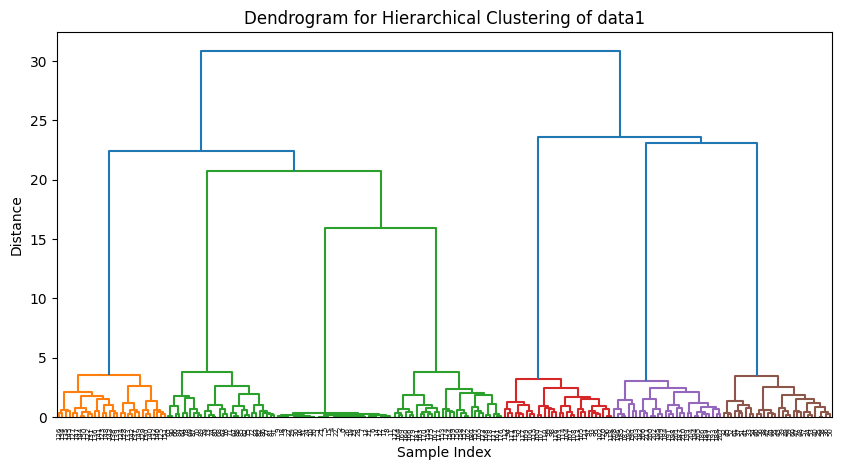

Cophenetic correlation coefficient: 0.7592322612920926


In [74]:
# Extract features
X = data_dict['data1'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data1")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 7 as an optimal number of clusters for this dataset, as shown below:

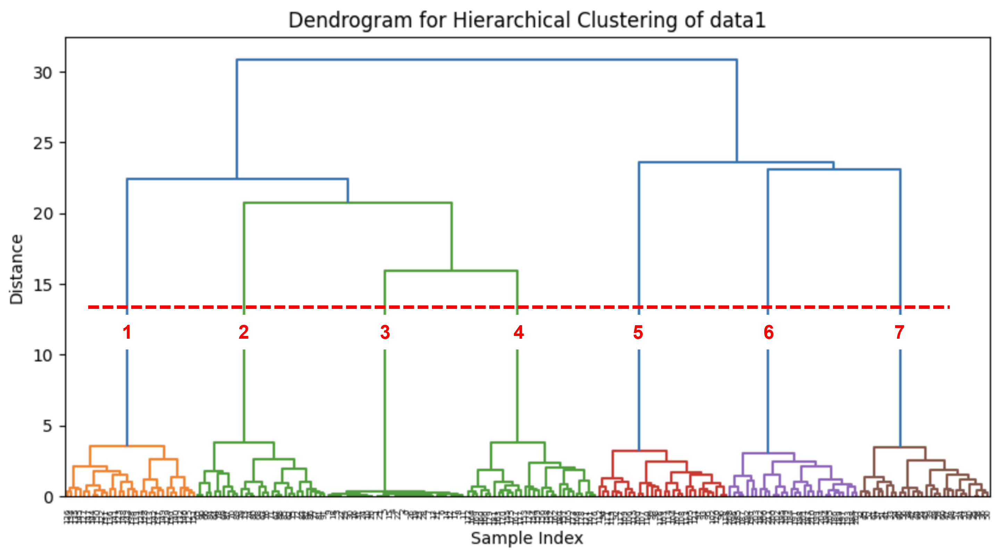

In [75]:
# Check if the 'Hierarchy Class' column already exists in the 'data1' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data1'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data1' dataframe
    _, data_dict['data1'] = hierarchy_clustering(data_dict['data1'], num_clusters = 7)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data1' dataframe
    del data_dict['data1']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data1' dataframe
    _, data_dict['data1'] = hierarchy_clustering(data_dict['data1'], num_clusters = 7)

In [76]:
data_dict['data1']

,X1,X2,X3,Class,K-Means Class,Hierarchy Class
1,-0.063274,0.027734,0.022683,0,6,6
2,-0.000731,0.048211,0.069198,0,6,6
3,-0.060767,-0.009080,0.053085,0,6,6
4,0.013252,-0.011876,0.055324,0,6,6
5,-0.054508,-0.003813,0.001738,0,6,6
...,...,...,...,...,...,...
208,0.175738,-0.053478,-2.733752,6,1,3
209,0.396046,-0.858377,-3.126866,6,1,3
210,-0.406362,-0.334541,-2.885598,6,1,3
211,-0.299275,0.071281,-3.642585,6,1,3


###**3D Plot for Data 1 According to the Original Class**

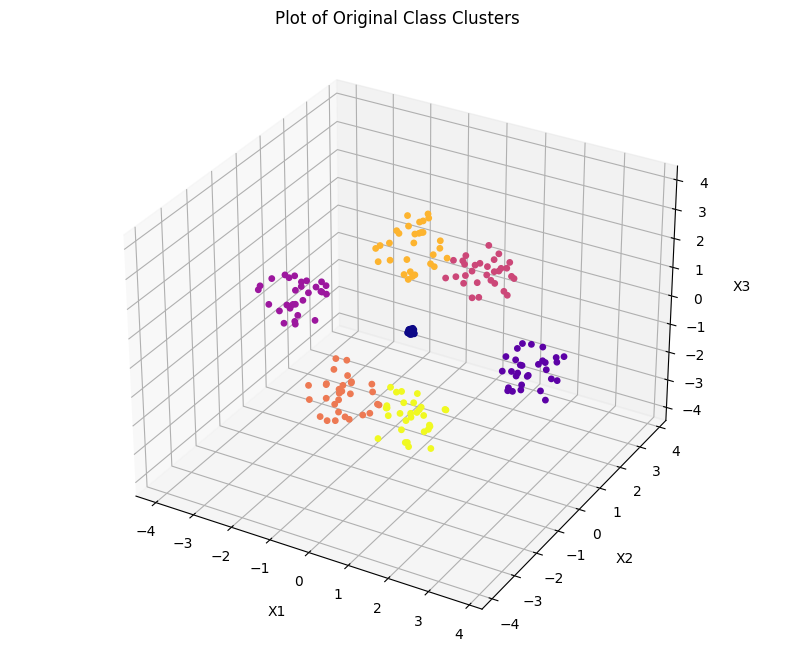

In [77]:
original_graph(data_dict['data1'])

###**3D Plot for Data 1 According to the K-Means Class**

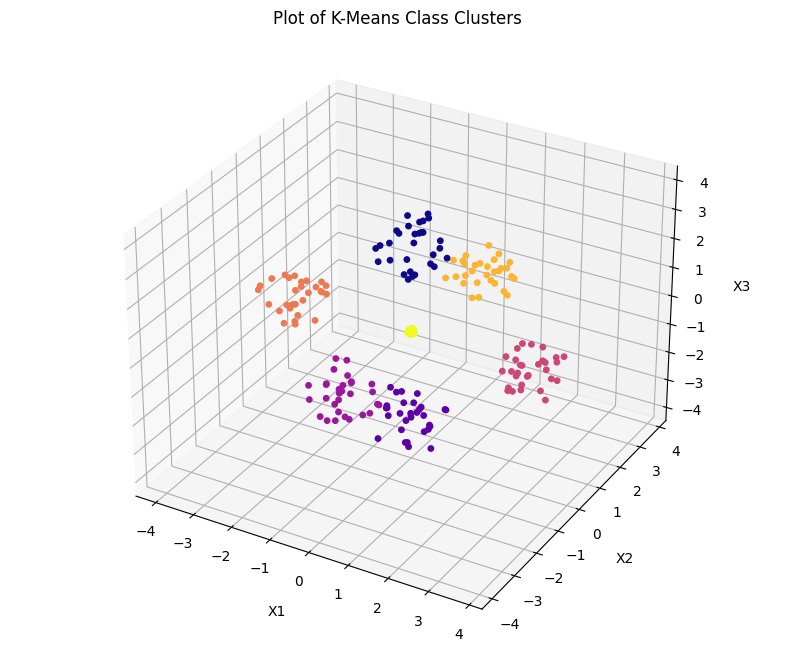

In [78]:
kmean_graph(data_dict['data1'])

###**3D Plot for Data 1 According to the Hierarchical Class**

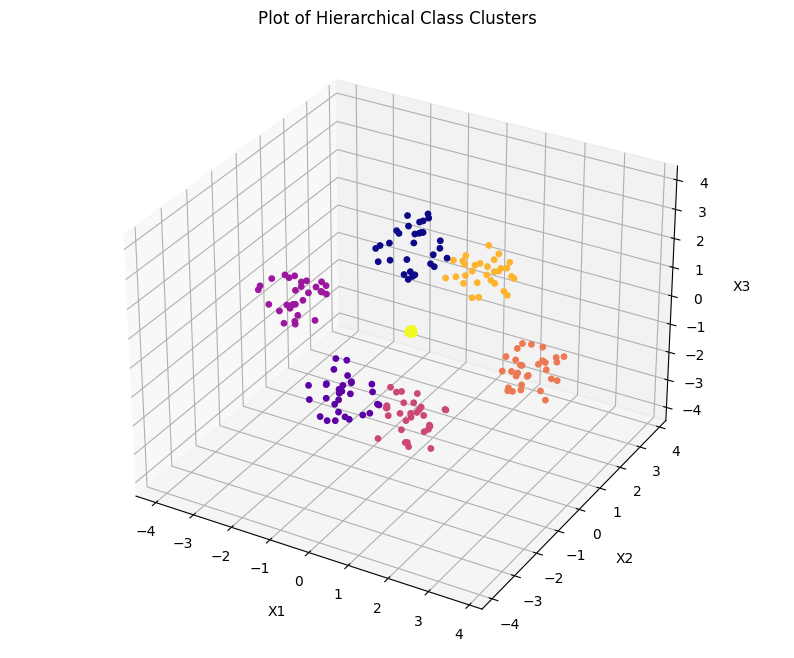

In [79]:
hierarchy_graph(data_dict['data1'])

###**PCA Scatter Plot for Data 1 for 2D Comparison of Class Labels**

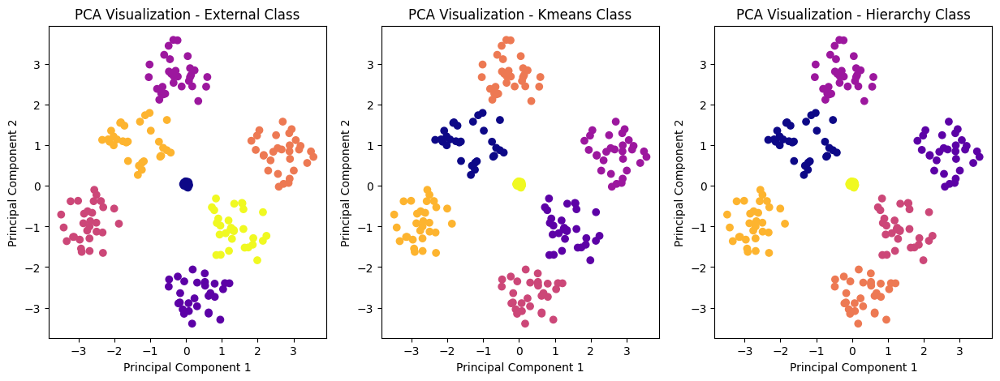

In [80]:
# Load the dataset
datatemp = data_dict['data1']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Analysis of Data 2**

In [81]:
data_dict['data2']

,X,Y,C,Class
X1,3.277701,0.814082,0.326574,0
X2,0.387577,0.176780,0.888046,0
X3,0.268546,0.582963,0.080981,0
X4,2.031145,0.244597,0.643921,0
X5,0.188677,0.461280,0.496633,0
...,...,...,...,...
X400,3.248655,2.297291,3.388138,2
X,4.100000,5.100000,0.504558,3
X.1,3.900000,4.900000,0.941634,3
X.2,4.000000,5.000000,0.702123,3


###**K-Mean Clustering of Data 2**

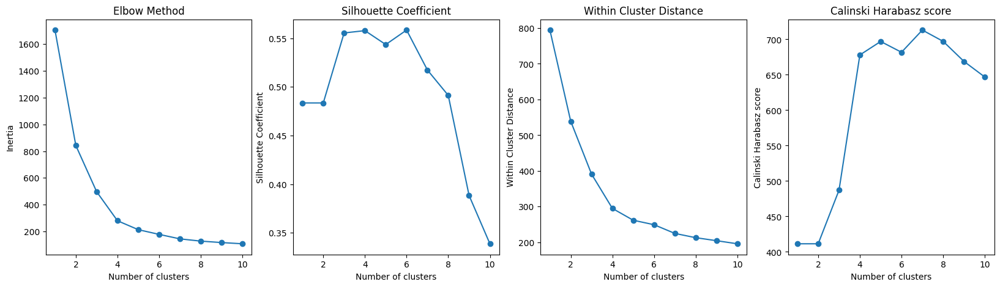

In [82]:
# Check if the 'K-Means Class' column already exists in the 'data2' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data2'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data2' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data2'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data2' dataframe
    del data_dict['data2']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data2' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data2'])

Based on the information given in the above plots, we can conclude that 4 is the most optimal number of clusters for the k-means clustering on data2.

Firstly, the Inertia and Within Cluster Distance keep decreasing as the number of clusters increases, but at a slower rate after 4 clusters. This indicates that adding more clusters beyond 4 may not lead to significant improvement in the clustering quality.

Secondly, the Silhouette Score has its peak value at 4 clusters. The Silhouette Score measures the quality of the clusters in terms of how similar the samples are to their own clusters compared to other clusters.

Calinski Harabasz Score is also relatively high for 4 clusters. Although the calinski harabasz score is higher for 5 clusters than for 4 clusters, the variance in the score is not that significant and clustering the data into 5 clusters would lead to overclustering.

Therefore, based on these metrics, we can conclude that 4 is the most optimal number of clusters for the given dataset using k-means clustering.

In [83]:
# Check if the 'K-Means Class' column already exists in the 'data2' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data2'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data2' dataframe
    data2_opt_inertia, data2_opt_cluster_centers, data2_opt_labels, data_dict['data2'] = k_means_clustering(data_dict['data2'], num_clusters=4)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data2' dataframe
    del data_dict['data2']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data2' dataframe
    data2_opt_inertia, data2_opt_cluster_centers, data2_opt_labels, data_dict['data2'] = k_means_clustering(data_dict['data2'], num_clusters=4)

In [84]:
data_dict['data2']

,X,Y,C,Class,K-Means Class
X1,3.277701,0.814082,0.326574,0,2
X2,0.387577,0.176780,0.888046,0,0
X3,0.268546,0.582963,0.080981,0,0
X4,2.031145,0.244597,0.643921,0,2
X5,0.188677,0.461280,0.496633,0,0
...,...,...,...,...,...
X400,3.248655,2.297291,3.388138,2,1
X,4.100000,5.100000,0.504558,3,3
X.1,3.900000,4.900000,0.941634,3,3
X.2,4.000000,5.000000,0.702123,3,3


###**Hierarchical Clustering of Data 2**

#####**Dendrogram for Hierarchical Clustering of Data 2**

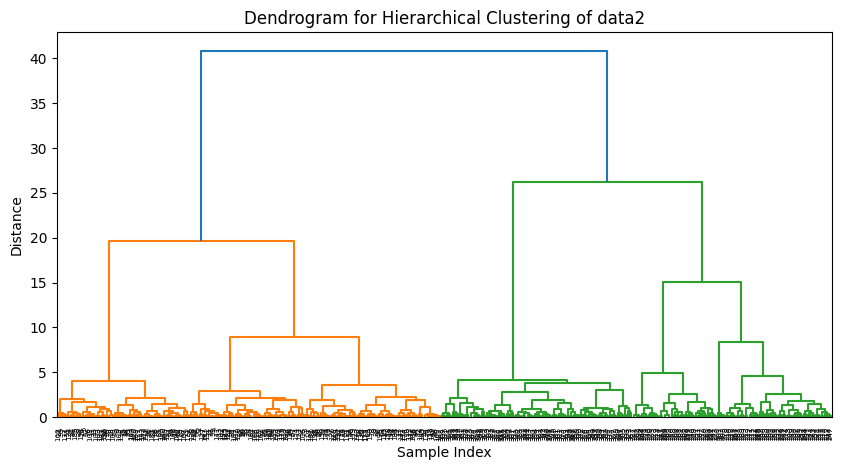

Cophenetic correlation coefficient: 0.7831614155118711


In [85]:
# Extract features
X = data_dict['data2'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data2")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 4 as an optimal number of clusters for this dataset, as shown below. Even though the horizontal line drawn across the middle of the tallest vertical distance in a dendrogram intersects with another horizontal line in the dendrogram at the same level, we consider that the nodes are not cut by the horizontal line.This is because in dendrograms, horizontal lines represent the merging of clusters or nodes, and the vertical lines represent the distance or dissimilarity between them. When two horizontal lines intersect at the same level, they represent the merging of the same two clusters or nodes, and so we consider them to be part of the same cluster.

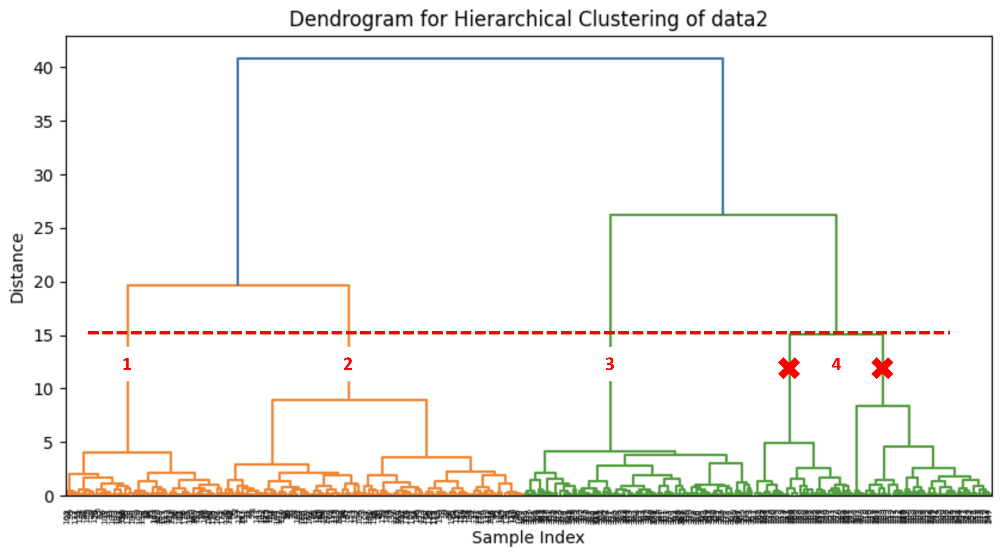

In [86]:
# Check if the 'Hierarchy Class' column already exists in the 'data2' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data2'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data2' dataframe
    _, data_dict['data2'] = hierarchy_clustering(data_dict['data2'], num_clusters = 4)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data2' dataframe
    del data_dict['data2']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data2' dataframe
    _, data_dict['data2'] = hierarchy_clustering(data_dict['data2'], num_clusters = 4)

In [87]:
data_dict['data2']

,X,Y,C,Class,K-Means Class,Hierarchy Class
X1,3.277701,0.814082,0.326574,0,2,3
X2,0.387577,0.176780,0.888046,0,0,1
X3,0.268546,0.582963,0.080981,0,0,1
X4,2.031145,0.244597,0.643921,0,2,1
X5,0.188677,0.461280,0.496633,0,0,1
...,...,...,...,...,...,...
X400,3.248655,2.297291,3.388138,2,1,2
X,4.100000,5.100000,0.504558,3,3,0
X.1,3.900000,4.900000,0.941634,3,3,0
X.2,4.000000,5.000000,0.702123,3,3,0


###**3D Plot for Data 2 According to the Original Class**

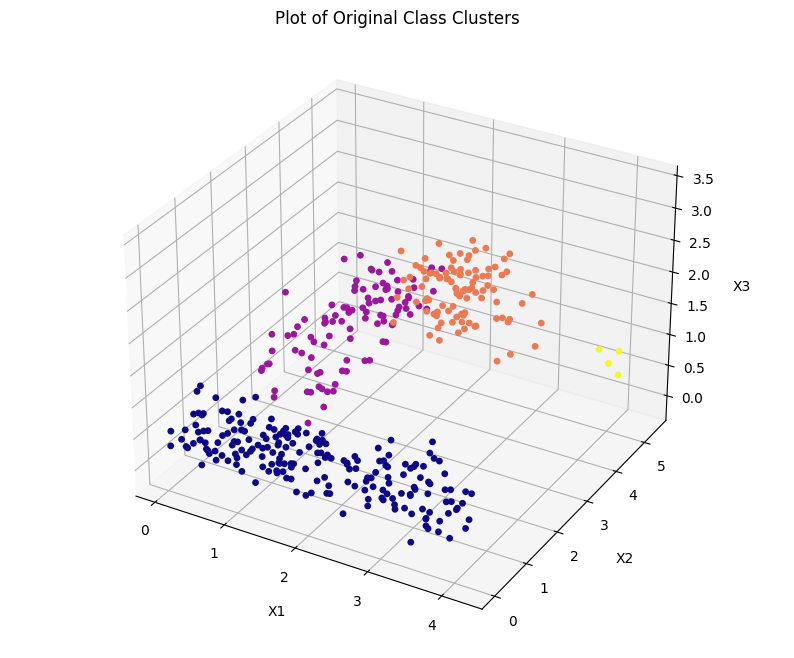

In [88]:
original_graph(data_dict['data2'])

###**3D Plot for Data 2 According to the K-Means Class**

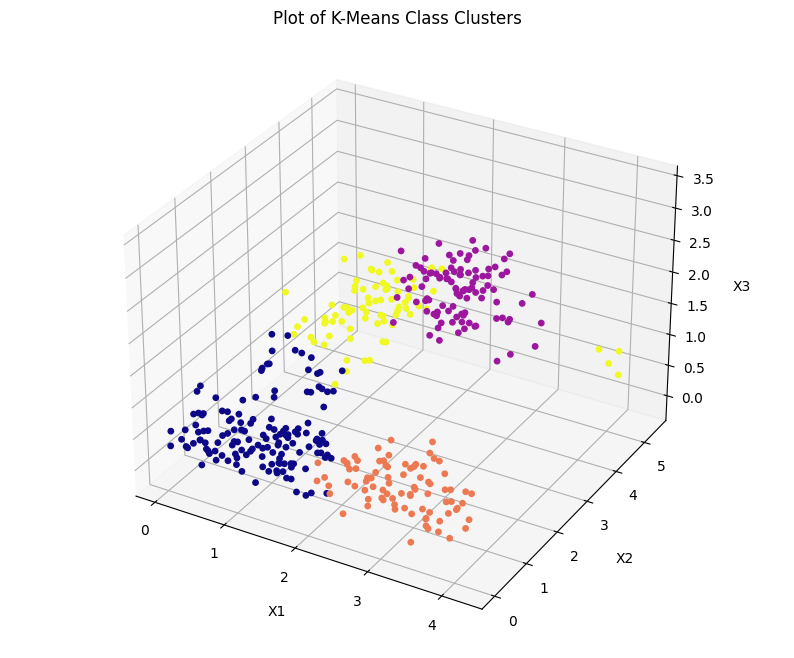

In [89]:
kmean_graph(data_dict['data2'])

###**3D Plot for Data 2 According to the Hierarchical Class**

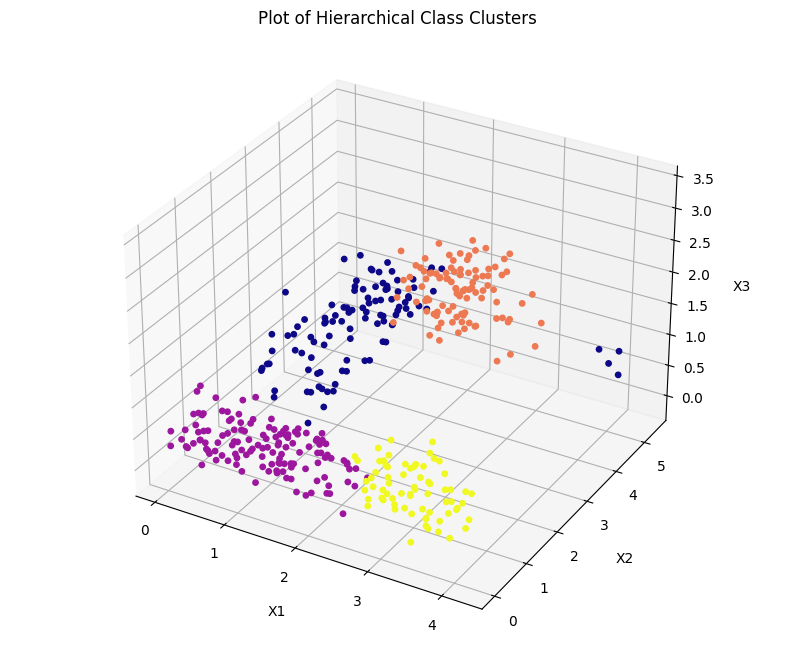

In [90]:
hierarchy_graph(data_dict['data2'])

###**PCA Scatter Plot for Data 2 for 2D Comparison of Class Labels**

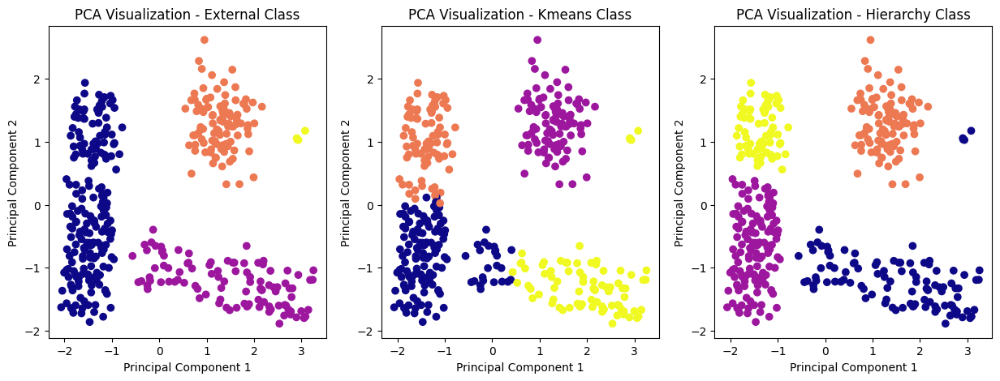

In [91]:
# Load the dataset
datatemp = data_dict['data2']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Analysis of Data 3**

In [92]:
data_dict['data3']

,X1,X2,X3,Class
1,1.295428,0.050829,-0.385217,0
2,1.409178,-0.035191,-0.251980,0
3,1.096803,0.246365,-0.415011,0
4,1.463328,0.265354,-0.513488,0
5,1.603284,0.080577,-0.470257,0
...,...,...,...,...
396,0.795695,0.209456,1.880609,3
397,0.653127,-0.703156,1.549448,3
398,-0.726249,-0.103244,0.694300,3
399,0.808596,-0.492640,1.649370,3


###**K-Mean Clustering of Data 3**

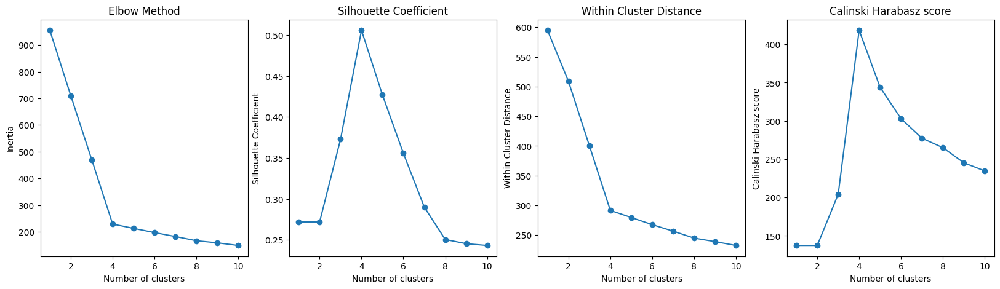

In [93]:
# Check if the 'K-Means Class' column already exists in the 'data3' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data3'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data3' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data3'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data3' dataframe
    del data_dict['data3']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data3' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data3'])

Based on the given internal validation analysis scores for k-means clustering on data3, the most optimal number of clusters appears to be 4.

The Within Cluster Distance, represented by the Inertia metric, decreases as the number of clusters increases. However, the rate of decrease diminishes as the number of clusters increases. The Within Cluster Distance also represents the sum of squared distances between each point and its assigned cluster center. According to this measure, the optimal number of clusters would be 4, as the Within Cluster Distance is still decreasing but at a slower rate, so adding more clusters would not improve performance significantly.

The Calinski Harabasz Score measures the ratio between the within-cluster dispersion and the between-cluster dispersion. A higher score indicates better-defined clusters. According to this measure, 4 clusters perform better than any other number of clusters.

According to the Silhouette Score, 4 clusters would again perform better than any other number of clusters.

Therefore, based on the available data, the most optimal number of clusters appears to be 4.

In [94]:
# Check if the 'K-Means Class' column already exists in the 'data3' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data3'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data3' dataframe
    data3_opt_inertia, data3_opt_cluster_centers, data3_opt_labels, data_dict['data3'] = k_means_clustering(data_dict['data3'], num_clusters=4)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data3' dataframe
    del data_dict['data3']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data3' dataframe
    data3_opt_inertia, data3_opt_cluster_centers, data3_opt_labels, data_dict['data3'] = k_means_clustering(data_dict['data3'], num_clusters=4)

In [95]:
data_dict['data3']

,X1,X2,X3,Class,K-Means Class
1,1.295428,0.050829,-0.385217,0,2
2,1.409178,-0.035191,-0.251980,0,2
3,1.096803,0.246365,-0.415011,0,2
4,1.463328,0.265354,-0.513488,0,2
5,1.603284,0.080577,-0.470257,0,2
...,...,...,...,...,...
396,0.795695,0.209456,1.880609,3,3
397,0.653127,-0.703156,1.549448,3,3
398,-0.726249,-0.103244,0.694300,3,3
399,0.808596,-0.492640,1.649370,3,3


###**Hierarchical Clustering of Data 3**

#####**Dendrogram for Hierarchical Clustering of Data 3**

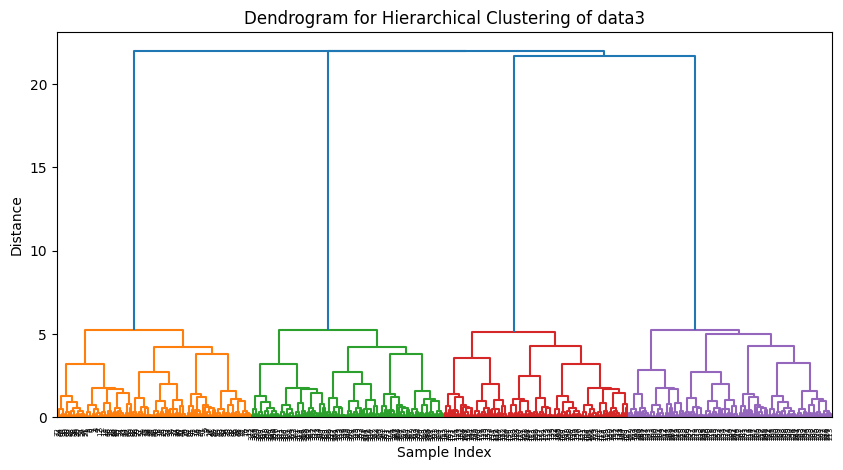

Cophenetic correlation coefficient: 0.7335666872126546


In [96]:
# Extract features
X = data_dict['data3'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data3")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 4 as an optimal number of clusters for this dataset, as shown below:

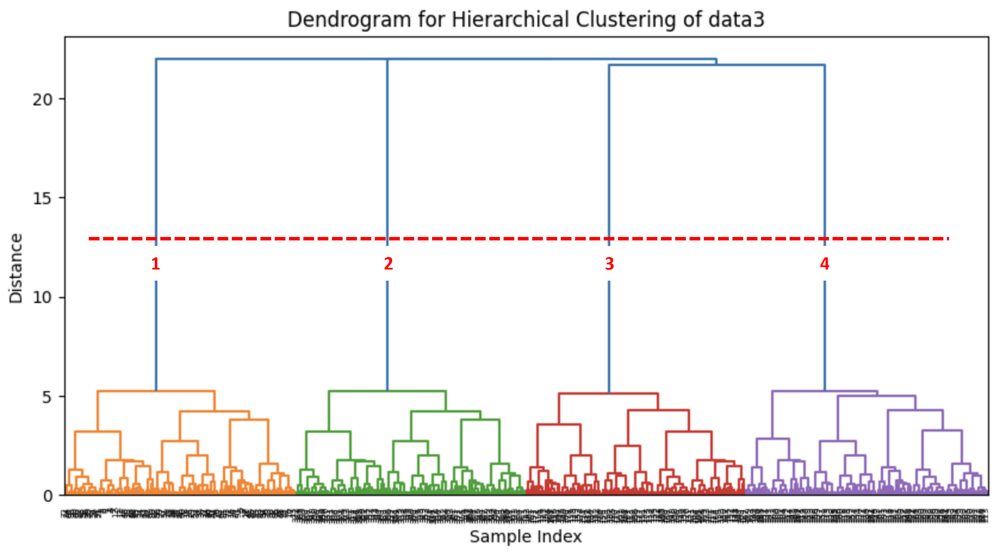

In [97]:
# Check if the 'Hierarchy Class' column already exists in the 'data3' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data3'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data3' dataframe
    _, data_dict['data3'] = hierarchy_clustering(data_dict['data3'], num_clusters = 4)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data3' dataframe
    del data_dict['data3']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data3' dataframe
    _, data_dict['data3'] = hierarchy_clustering(data_dict['data3'], num_clusters = 4)

In [98]:
data_dict['data3']

,X1,X2,X3,Class,K-Means Class,Hierarchy Class
1,1.295428,0.050829,-0.385217,0,2,1
2,1.409178,-0.035191,-0.251980,0,2,1
3,1.096803,0.246365,-0.415011,0,2,1
4,1.463328,0.265354,-0.513488,0,2,1
5,1.603284,0.080577,-0.470257,0,2,1
...,...,...,...,...,...,...
396,0.795695,0.209456,1.880609,3,3,2
397,0.653127,-0.703156,1.549448,3,3,2
398,-0.726249,-0.103244,0.694300,3,3,2
399,0.808596,-0.492640,1.649370,3,3,2


###**3D Plot for Data 3 According to the Original Class**

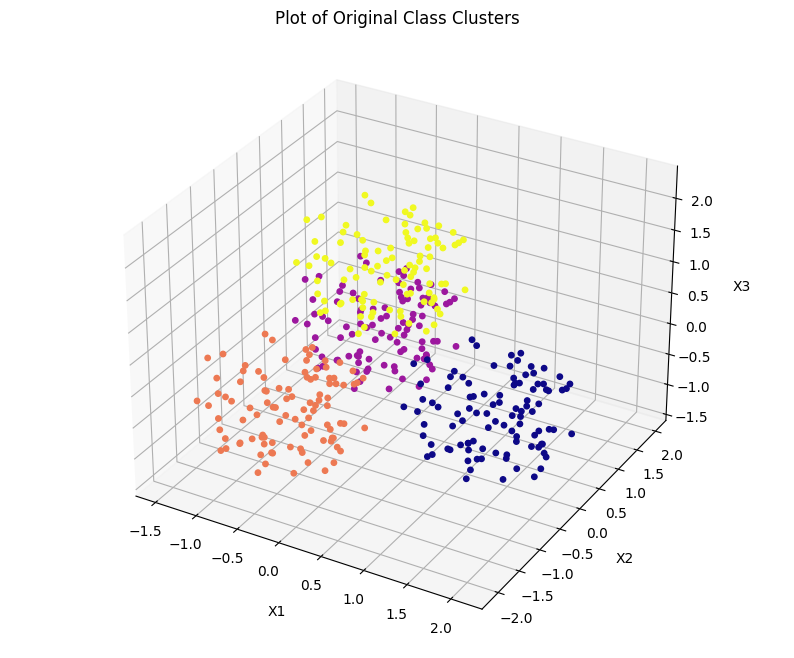

In [99]:
original_graph(data_dict['data3'])

###**3D Plot for Data 3 According to the K-Means Class**

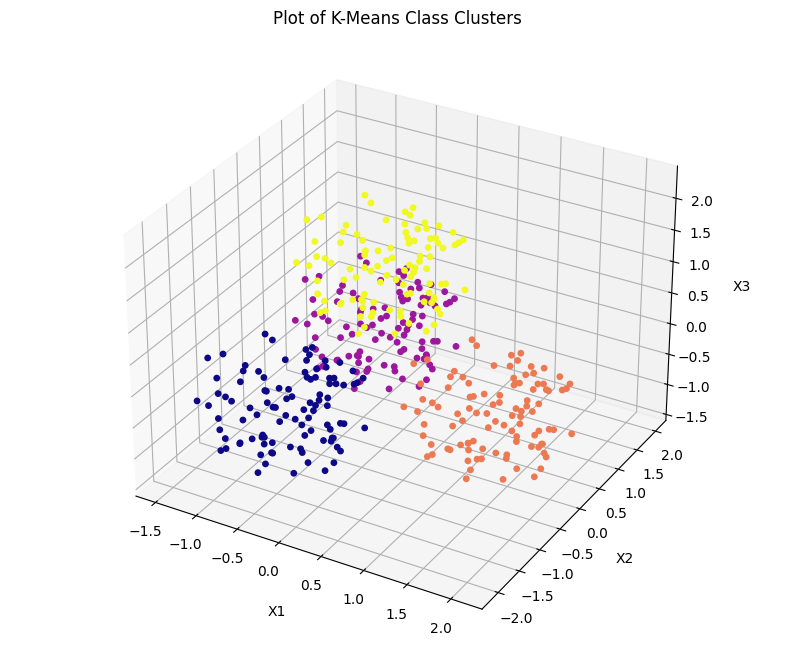

In [100]:
kmean_graph(data_dict['data3'])

###**3D Plot for Data 3 According to the Hierarchical Class**

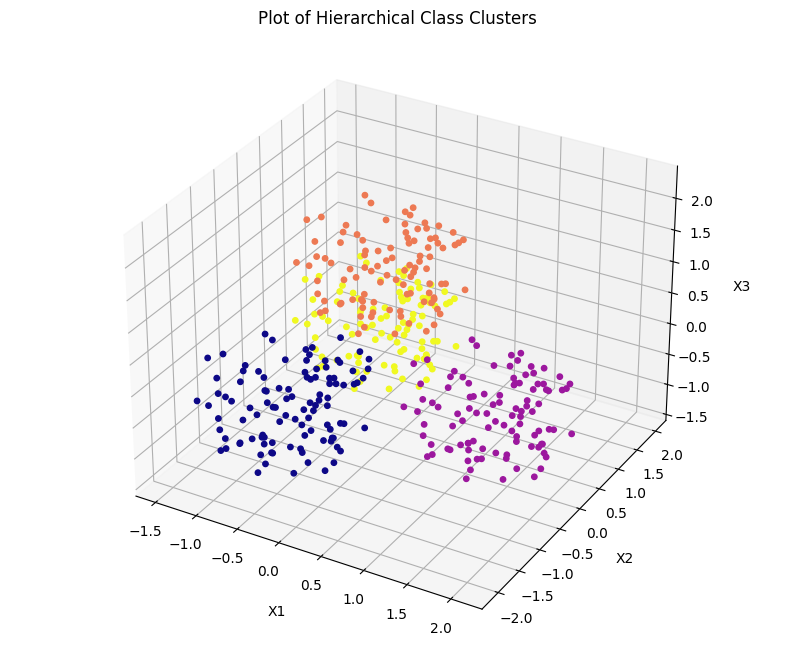

In [101]:
hierarchy_graph(data_dict['data3'])

###**PCA Scatter Plot for Data 3 for 2D Comparison of Class Labels**

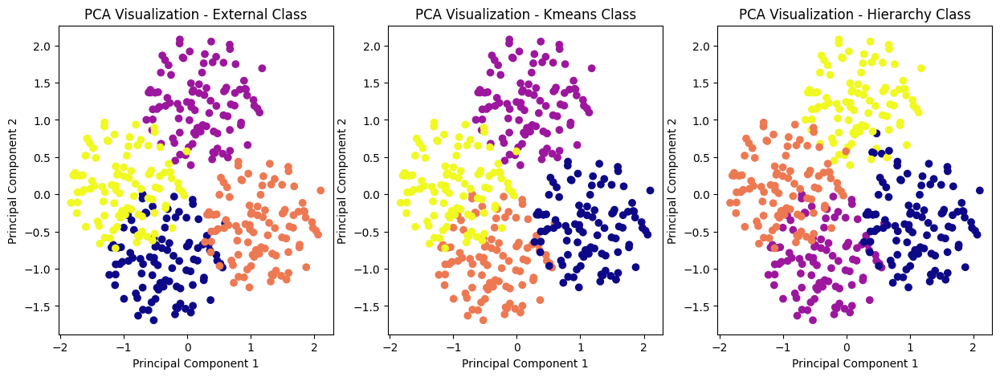

In [102]:
# Load the dataset
datatemp = data_dict['data3']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Analysis of Data 4**

In [103]:
data_dict['data4']

,X1,X2,X3,Class
1,-0.45300,-0.8910,0.02300,0
2,0.65300,-0.8460,0.02110,0
3,0.39800,0.9130,-0.00139,0
4,0.09520,1.0500,0.00628,0
5,0.52400,-0.9410,0.03780,0
...,...,...,...,...
996,0.01520,0.0531,-0.36100,1
997,0.05160,0.6910,0.87500,1
998,-0.00511,1.3900,-0.94700,1
999,-0.06710,0.7140,0.88100,1


###**K-Mean Clustering of Data 4**

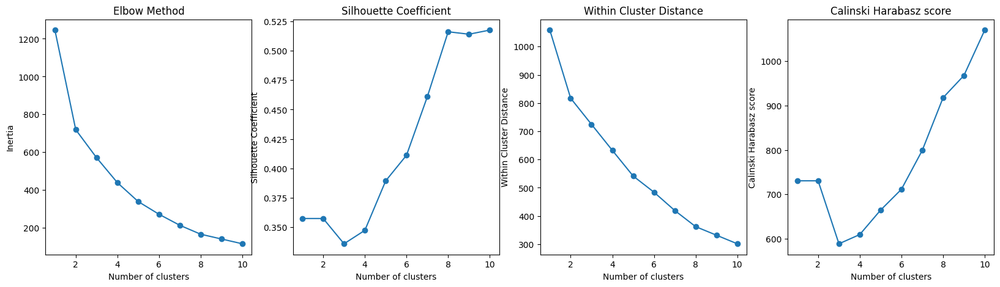

In [104]:
# Check if the 'K-Means Class' column already exists in the 'data4' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data4'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data4' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data4'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data4' dataframe
    del data_dict['data4']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data4' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data4'])

Based on the information provided by the above plots, it is difficult to conclusively determine the optimal number of clusters for the k-means clustering algorithm as different validation metrics suggest different cluster numbers as optimal. However, considering the tradeoff between the metrics, it seems that the optimal number of clusters could be 2 or 8.
The inertia decreases as the number of clusters increases, which suggests that increasing the number of clusters will lead to better separation of the data points, but it also leads to smaller clusters, which may not be desirable. 
The silhouette score increases up to a certain point and then levels off. The silhouette score of the 8, 9 and 10 clusters is relatively high and similar, which indicates that these three numbers of clusters are optimal, hence, by this logic, 8 clusters would be optimal to avoid overclustering. However, at 2 clusters is a good local deflection point, as the silhouette score dips sharply between 2 and 4 clusters.
The Calinski Harabasz score continues to increase but is relatively high for 8 clusters as well. However, for this metric as well, at 2 clusters is a good local deflection point, as the Calinski Harabasz score dips sharply between 2 and 4 clusters.
The within-cluster distance metric decreases as the number of clusters increases, but it is not a conclusive metric for selecting the optimal number of clusters.
Therefore, based on the given information, it can be concluded that 2 or 8 clusters can be considered as the most optimal number of clusters for this dataset. However, to avoid over clustering we are going with 2 clusters.
Please note that while Silhouette score and Calinski Harabasz score is relatively high for 2 clusters, the within clusters difference is too big at 2 clusters. So, if the goal is to get dense and well-separated clusters, the data can also be divided into 8 clusters.

In [105]:
# Check if the 'K-Means Class' column already exists in the 'data4' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data4'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data4' dataframe
    data4_opt_inertia, data4_opt_cluster_centers, data4_opt_labels, data_dict['data4'] = k_means_clustering(data_dict['data4'], num_clusters=2)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data4' dataframe
    del data_dict['data4']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data4' dataframe
    data4_opt_inertia, data4_opt_cluster_centers, data4_opt_labels, data_dict['data4'] = k_means_clustering(data_dict['data4'], num_clusters=2)

In [106]:
data_dict['data4']

,X1,X2,X3,Class,K-Means Class
1,-0.45300,-0.8910,0.02300,0,1
2,0.65300,-0.8460,0.02110,0,1
3,0.39800,0.9130,-0.00139,0,0
4,0.09520,1.0500,0.00628,0,0
5,0.52400,-0.9410,0.03780,0,1
...,...,...,...,...,...
996,0.01520,0.0531,-0.36100,1,1
997,0.05160,0.6910,0.87500,1,0
998,-0.00511,1.3900,-0.94700,1,0
999,-0.06710,0.7140,0.88100,1,0


###**Hierarchical Clustering of Data 4**

#####**Dendrogram for Hierarchical Clustering of Data 4**

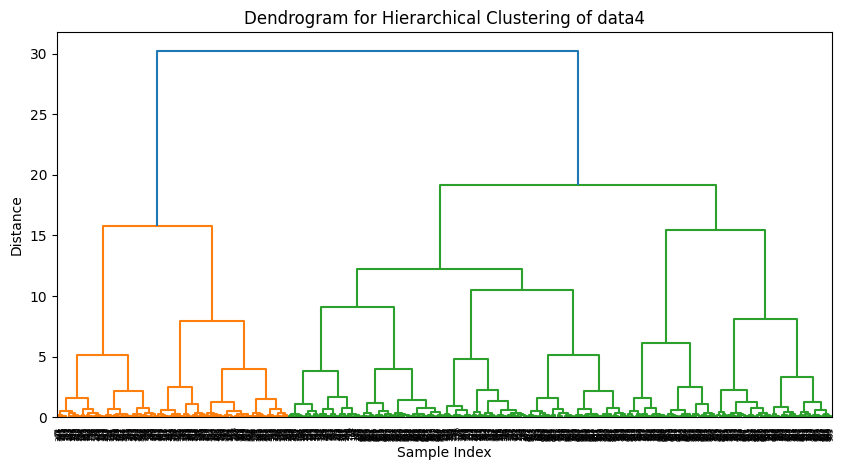

Cophenetic correlation coefficient: 0.6704618244800796


In [107]:
# Extract features
X = data_dict['data4'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data4")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 2 as an optimal number of clusters for this dataset, as shown below:

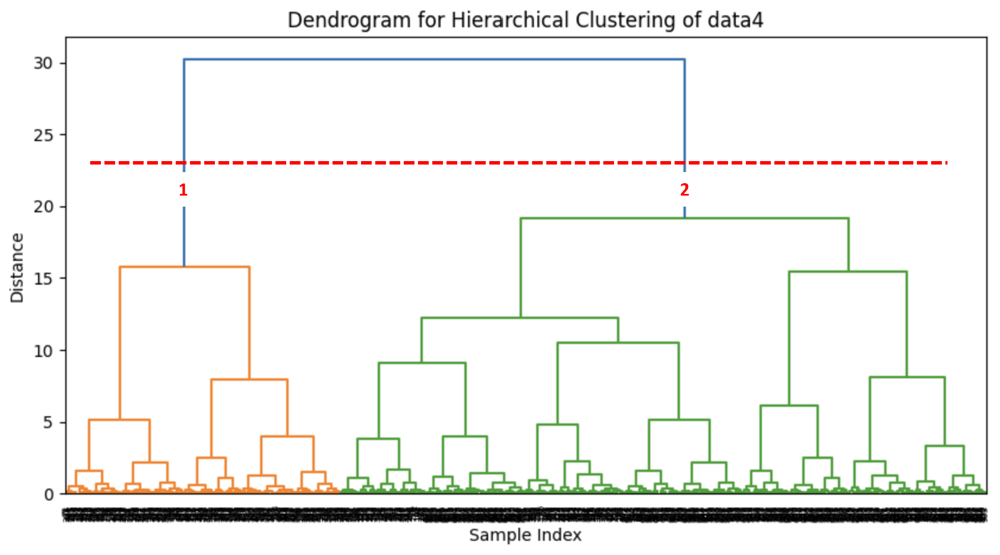

In [108]:
# Check if the 'Hierarchy Class' column already exists in the 'data4' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data4'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data4' dataframe
    _, data_dict['data4'] = hierarchy_clustering(data_dict['data4'], num_clusters = 2)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data4' dataframe
    del data_dict['data4']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data4' dataframe
    _, data_dict['data4'] = hierarchy_clustering(data_dict['data4'], num_clusters = 2)

In [109]:
data_dict['data4']

,X1,X2,X3,Class,K-Means Class,Hierarchy Class
1,-0.45300,-0.8910,0.02300,0,1,1
2,0.65300,-0.8460,0.02110,0,1,1
3,0.39800,0.9130,-0.00139,0,0,0
4,0.09520,1.0500,0.00628,0,0,0
5,0.52400,-0.9410,0.03780,0,1,1
...,...,...,...,...,...,...
996,0.01520,0.0531,-0.36100,1,1,0
997,0.05160,0.6910,0.87500,1,0,0
998,-0.00511,1.3900,-0.94700,1,0,0
999,-0.06710,0.7140,0.88100,1,0,0


###**3D Plot for Data 4 According to the Original Class**

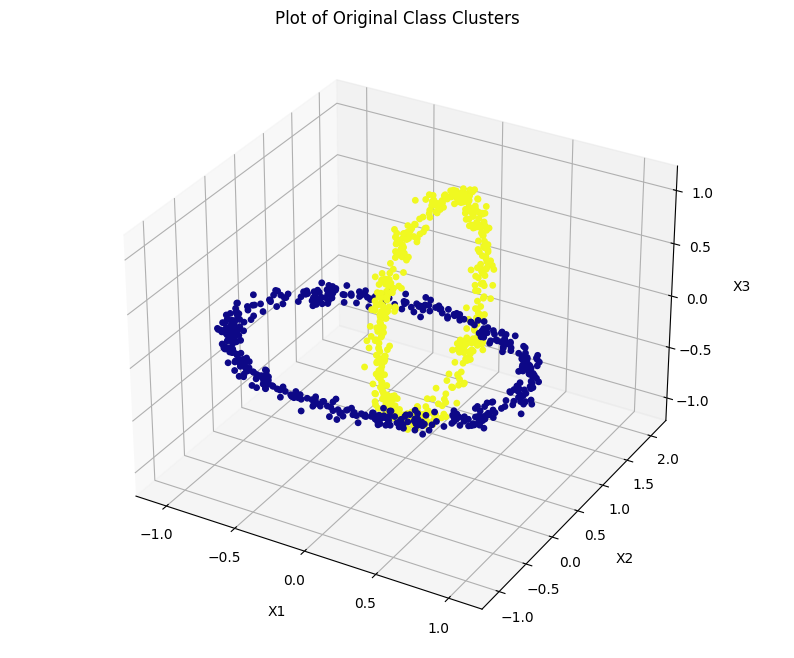

In [110]:
original_graph(data_dict['data4'])

###**3D Plot for Data 4 According to the K-Means Class**

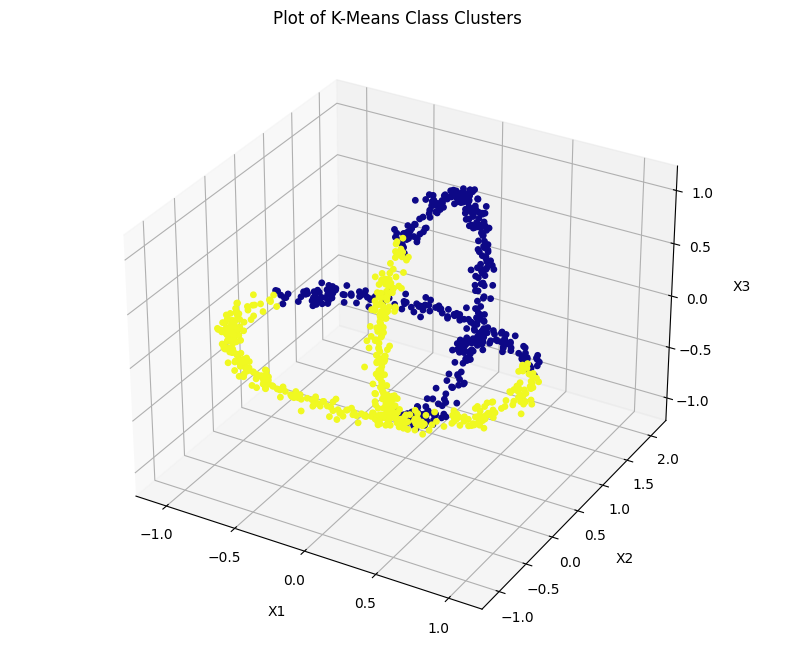

In [111]:
kmean_graph(data_dict['data4'])

###**3D Plot for Data 4 According to the Hierarchical Class**

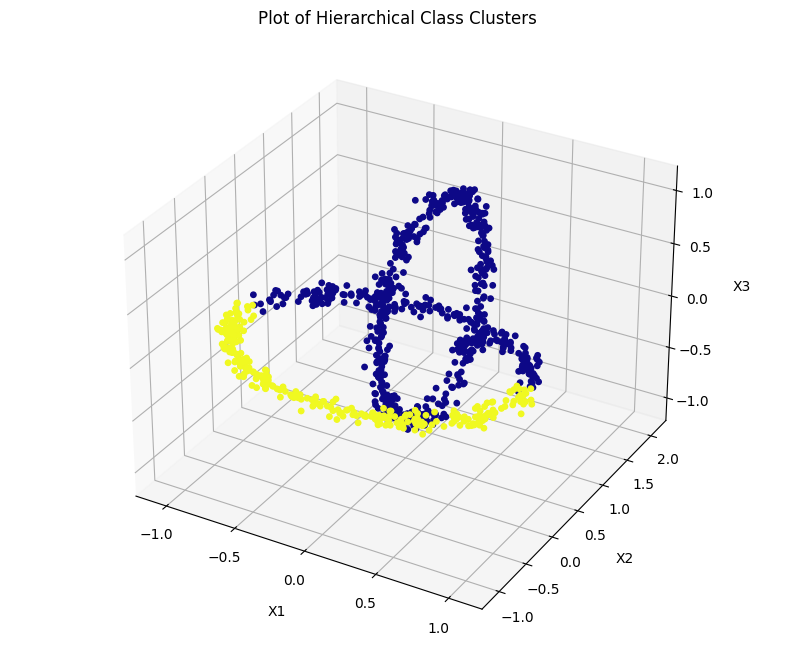

In [112]:
hierarchy_graph(data_dict['data4'])

As is obvious from the above plots, both the clustering algorithms failed to identify the ring-like shape of the dataset. For data lying in non-linear structures, such as ring shapes, it is a better choice to use a density-based clustering algorithm such as DBSCAN (Density-Based Spatial Clustering of Applications with Noise). See below for reference.

Estimated number of clusters: 2


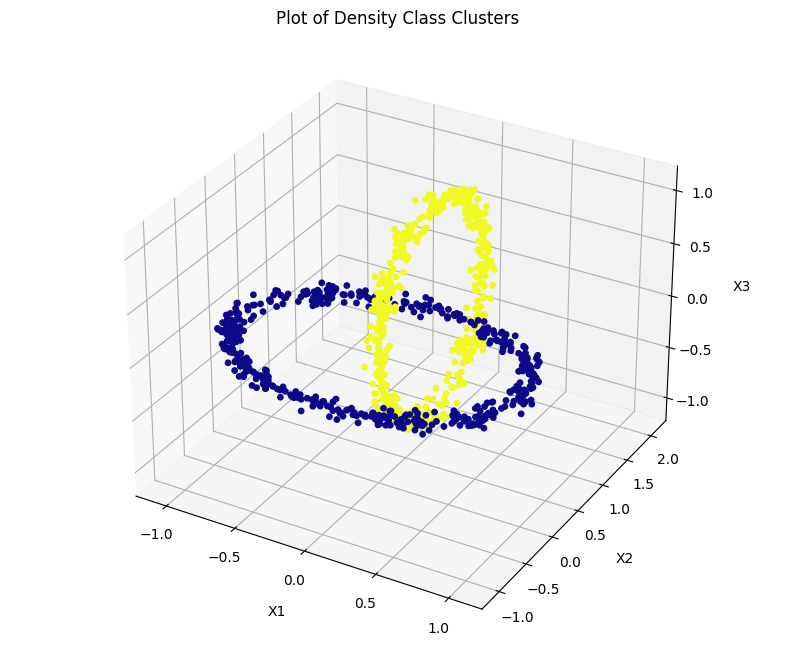

In [113]:
# Load the data
tempdata4 = data_dict['data4'].drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis = 1)

# Convert data to numpy array
X = np.array(tempdata4)

# Set up the DBSCAN clustering algorithm with appropriate parameters
eps = 0.2 # Determines the maximum distance between two samples for them to be considered as part of the same cluster
min_samples = 10 # Minimum number of samples required to form a dense region
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit the DBSCAN model to the data
dbscan.fit(X)

# Get the cluster labels
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print('Estimated number of clusters: %d' % n_clusters_)

tempdata4['Density Class'] = labels

x = tempdata4.iloc[:, 0]
y = tempdata4.iloc[:, 1]
z = tempdata4.iloc[:, 2]
label = tempdata4.loc[:, 'Density Class']

# Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
fig, ax = plt.subplots(figsize=(10, 8))

# Remove axis lines and markings for 3D graph
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

# Create a dictionary named 'plot_settings' to store various plot settings
plot_settings = {
   'c': label,
   'cmap': 'plasma',
   'alpha': 1,
   's': 15
 }


ax = fig.add_subplot(projection='3d')
ax.scatter(x, y, z, **plot_settings)
ax.set_xlabel("X1", labelpad=10)
ax.set_ylabel("X2", labelpad=10)
ax.set_zlabel("X3", labelpad=10)
ax.set_title("Plot of Density Class Clusters")

plt.show()



###**PCA Scatter Plot for Data 4 for 2D Comparison of Class Labels**

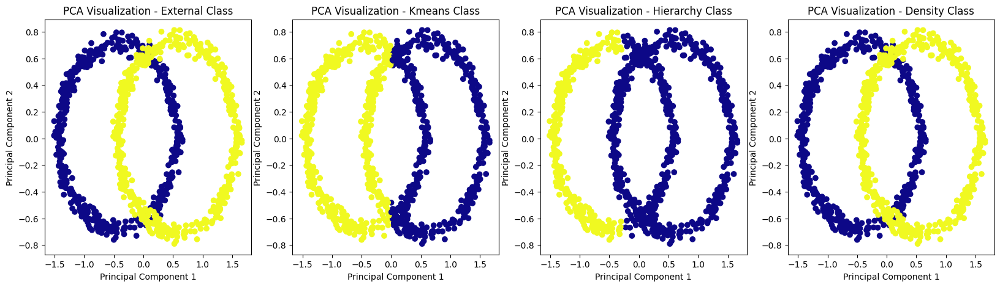

In [114]:
# Load the dataset
datatemp = data_dict['data4']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']
density_class = tempdata4['Density Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

axes[3].scatter(X_pca[:, 0], X_pca[:, 1], c=density_class, cmap = 'plasma')
axes[3].set_title('PCA Visualization - Density Class')
axes[3].set_xlabel('Principal Component 1')
axes[3].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Analysis of Data 5**

In [115]:
data_dict['data5']

,X1,X2,X3,Class
1,-4.822490,-50.402170,4.020861,0
2,-44.460120,20.964670,-11.492060,0
3,50.001020,0.780748,9.134460,0
4,-41.699080,-22.310060,16.314120,0
5,4.425242,-4.666664,50.223740,0
...,...,...,...,...
796,-1.531027,0.681636,0.543271,1
797,0.500754,-1.848209,0.605654,1
798,1.089574,-0.246493,-3.355758,1
799,-1.907717,4.964502,2.098423,1


###**K-Mean Clustering of Data 5**

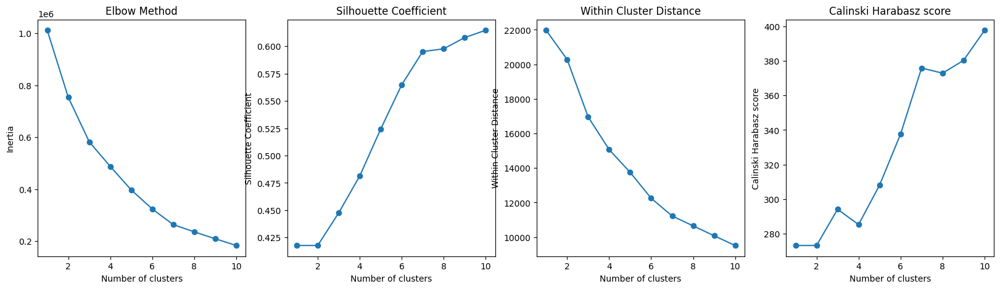

In [116]:
# Check if the 'K-Means Class' column already exists in the 'data5' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data5'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data5' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data5'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data5' dataframe
    del data_dict['data5']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data5' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data5'])

Based on the provided internal validation analysis scores for k-means clustering on a dataset 5, the most optimal number of clusters appears to be 7. This conclusion is drawn from several observations. Firstly, the inertia of the clusters decreases as the number of clusters increases, but this decrease slows down after 7 clusters. Secondly, the silhouette score increases at a high rate till 7 clusters, and the increase in the score slows down significantly after that that, indicating that the data points are sufficiently well-assigned to their respective clusters compared to other clusters at 7 number of clusters, and increasing the number of clusters beyong that will lead to overclustering. Thirdly, the within-cluster distance decreases as the number of clusters increases, but this decrease also slows down after 7 clusters. Finally, the Calinski Harabasz score, which measures the ratio of between-cluster variance to within-cluster variance, is relatively very high at 7 clusters, and the increace after that is not significant. Taken together, these metrics suggest that 7 clusters is the most optimal number for this particular dataset.

In [117]:
# Check if the 'K-Means Class' column already exists in the 'data5' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data5'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data5' dataframe
    data5_opt_inertia, data5_opt_cluster_centers, data5_opt_labels, data_dict['data5'] = k_means_clustering(data_dict['data5'], num_clusters=7)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data5' dataframe
    del data_dict['data5']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data5' dataframe
    data5_opt_inertia, data5_opt_cluster_centers, data5_opt_labels, data_dict['data5'] = k_means_clustering(data_dict['data5'], num_clusters=7)

In [118]:
data_dict['data5']

,X1,X2,X3,Class,K-Means Class
1,-4.822490,-50.402170,4.020861,0,3
2,-44.460120,20.964670,-11.492060,0,2
3,50.001020,0.780748,9.134460,0,6
4,-41.699080,-22.310060,16.314120,0,5
5,4.425242,-4.666664,50.223740,0,1
...,...,...,...,...,...
796,-1.531027,0.681636,0.543271,1,0
797,0.500754,-1.848209,0.605654,1,0
798,1.089574,-0.246493,-3.355758,1,0
799,-1.907717,4.964502,2.098423,1,0


###**Hierarchical Clustering of Data 5**

#####**Dendrogram for Hierarchical Clustering of Data 5**

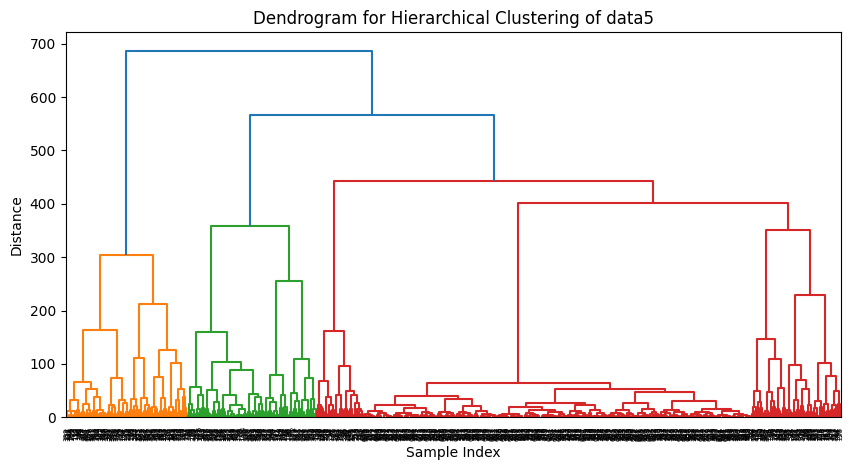

Cophenetic correlation coefficient: 0.8289073892046884


In [119]:
# Extract features
X = data_dict['data5'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data5")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 3 as an optimal number of clusters for this dataset, as shown below:

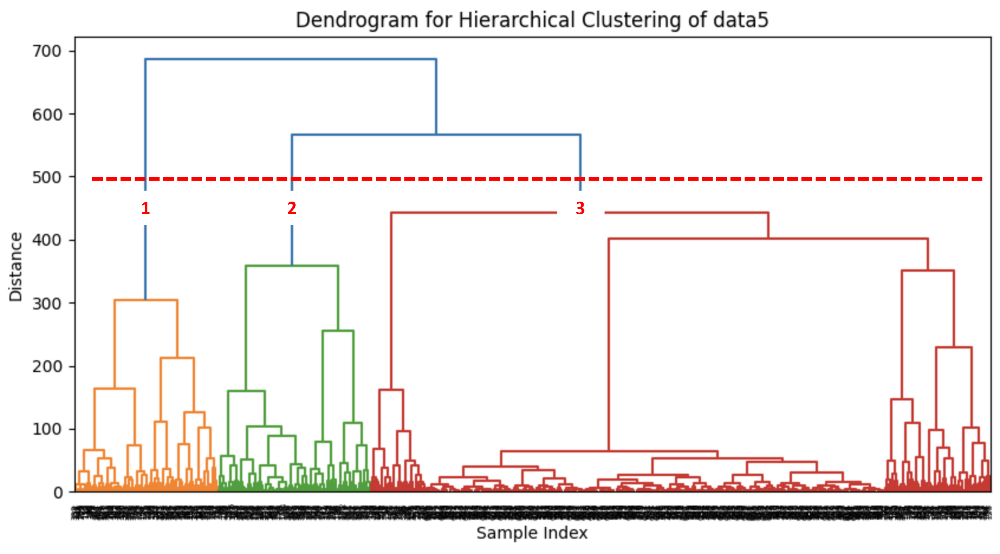

In [120]:
# Check if the 'Hierarchy Class' column already exists in the 'data5' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data5'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data5' dataframe
    _, data_dict['data5'] = hierarchy_clustering(data_dict['data5'], num_clusters = 3)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data5' dataframe
    del data_dict['data5']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data5' dataframe
    _, data_dict['data5'] = hierarchy_clustering(data_dict['data5'], num_clusters = 3)

In [121]:
data_dict['data5']

,X1,X2,X3,Class,K-Means Class,Hierarchy Class
1,-4.822490,-50.402170,4.020861,0,3,1
2,-44.460120,20.964670,-11.492060,0,2,0
3,50.001020,0.780748,9.134460,0,6,2
4,-41.699080,-22.310060,16.314120,0,5,0
5,4.425242,-4.666664,50.223740,0,1,2
...,...,...,...,...,...,...
796,-1.531027,0.681636,0.543271,1,0,0
797,0.500754,-1.848209,0.605654,1,0,0
798,1.089574,-0.246493,-3.355758,1,0,0
799,-1.907717,4.964502,2.098423,1,0,0


###**3D Plot for Data 5 According to the Original Class**

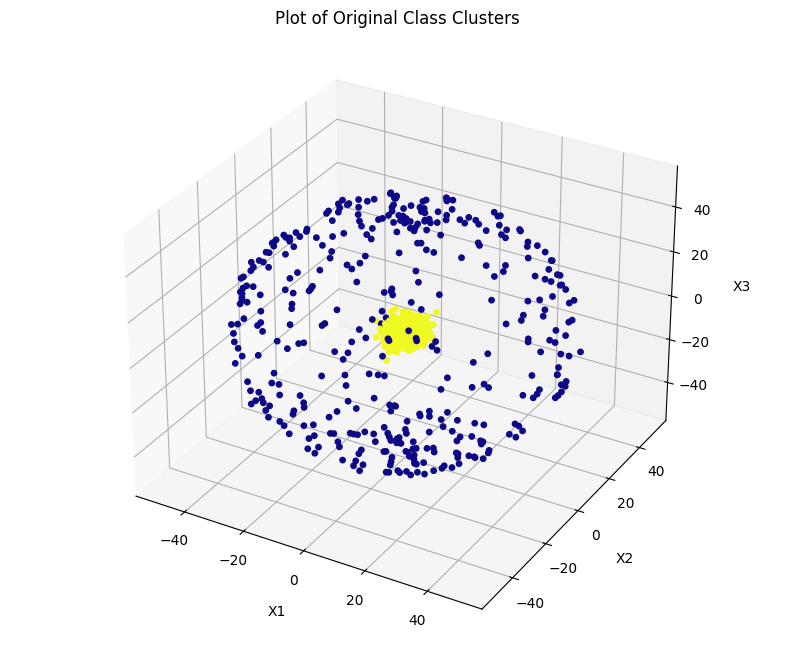

In [128]:
original_graph(data_dict['data5'])

###**3D Plot for Data 5 According to the K-Means Class**

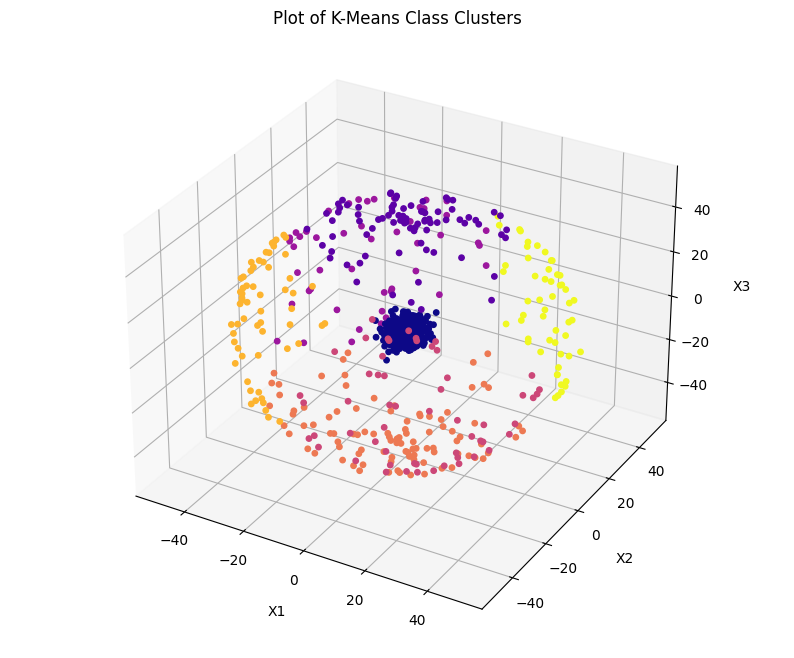

In [129]:
kmean_graph(data_dict['data5'])

###**3D Plot for Data 5 According to the Hierarchical Class**

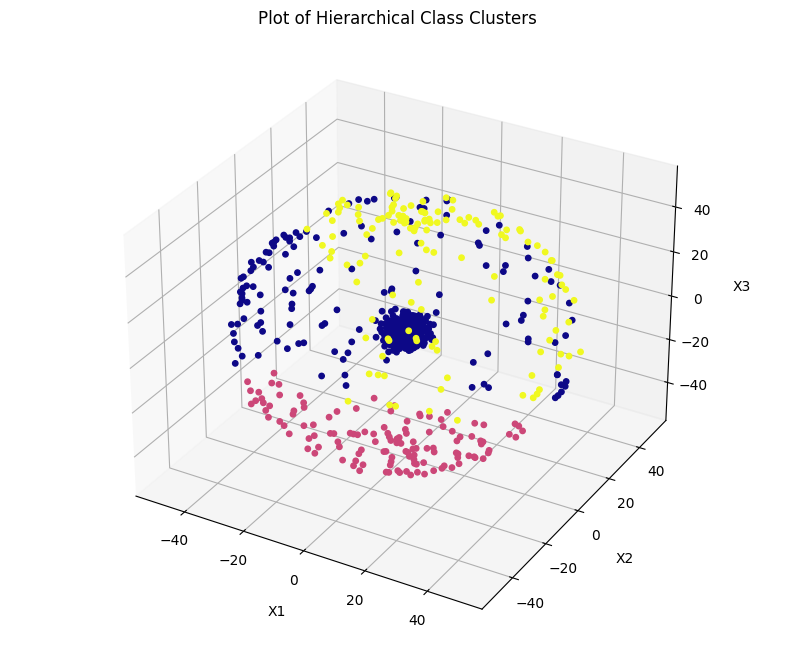

In [130]:
hierarchy_graph(data_dict['data5'])

As is obvious from the above plots, both the clustering algorithms failed to identify the sheprical shape of the dataset with a smaller cluster at the center. Therefore, a better approach for clustering would be to use a density-based clustering method such as HDBSCAN that can capture the spherical structures and the varying density of the points. See below for reference.


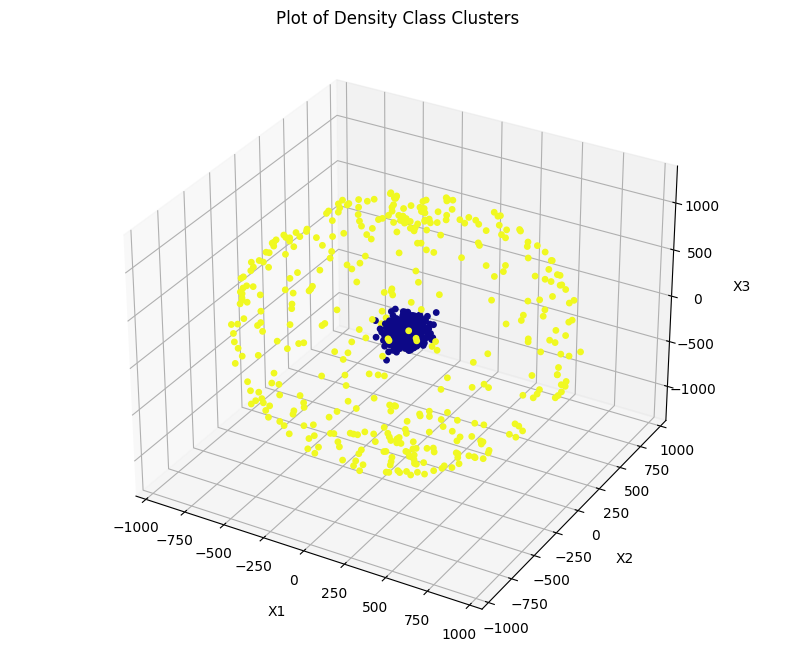

In [127]:
# Extract data from data_dict
tempdata5 = np.array(data_dict['data5'].drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1))

# Scale the data
scaler = StandardScaler()
tempdata5_scaled = scaler.fit_transform(tempdata5)

# Cluster the data using HDBSCAN
min_cluster_size = 5
min_samples = 5
clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
cluster_labels = clusterer.fit_predict(tempdata5_scaled)

# Add cluster labels to the original dataset
tempdata5_labeled = np.column_stack((tempdata5, cluster_labels))

# Invert the scaling to get the original data
tempdata5_unscaled = scaler.inverse_transform(tempdata5_labeled[:, :-1])

# Combine feature columns with cluster labels
tempdata5_labeled = np.column_stack((tempdata5_unscaled, tempdata5_labeled[:, -1]))

# Create a pandas dataframe and save as CSV
tempdata5 = pd.DataFrame(tempdata5_labeled, columns=['x', 'y', 'z', 'Density Class'])

x = tempdata5.iloc[:, 0]
y = tempdata5.iloc[:, 1]
z = tempdata5.iloc[:, 2]
label = tempdata5.loc[:, 'Density Class']

# Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
fig, ax = plt.subplots(figsize=(10, 8))

# Remove axis lines and markings for 3D graph
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

# Create a dictionary named 'plot_settings' to store various plot settings
plot_settings = {
   'c': label,
   'cmap': 'plasma',
   'alpha': 1,
   's': 15
 }

ax = fig.add_subplot(projection='3d')
ax.scatter(x, y, z, **plot_settings)
ax.set_xlabel("X1", labelpad=10)
ax.set_ylabel("X2", labelpad=10)
ax.set_zlabel("X3", labelpad=10)
ax.set_title("Plot of Density Class Clusters")

plt.show()


###**PCA Scatter Plot for Data 5 for 2D Comparison of Class Labels**

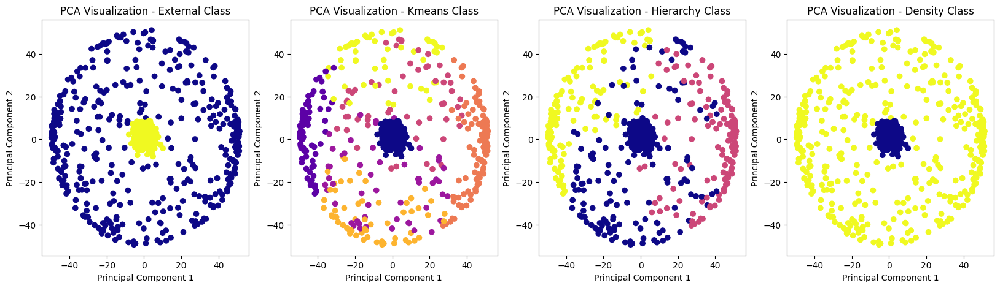

In [131]:
# Load the dataset
datatemp = data_dict['data5']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']
density_class = tempdata5['Density Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

axes[3].scatter(X_pca[:, 0], X_pca[:, 1], c=density_class, cmap = 'plasma')
axes[3].set_title('PCA Visualization - Density Class')
axes[3].set_xlabel('Principal Component 1')
axes[3].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Analysis of Data 6**

In [132]:
data_dict['data6']

,X1,X2,Class
1,1.388261,2.076096,0
2,2.177247,3.102304,0
3,0.378645,5.307610,0
4,3.681732,1.622681,0
5,2.462861,2.777897,0
...,...,...,...
4092,0.909687,0.375763,1
4093,2.698381,0.511262,1
4094,1.078797,1.526153,1
4095,1.974889,-0.649343,1


###**K-Mean Clustering of Data 6**

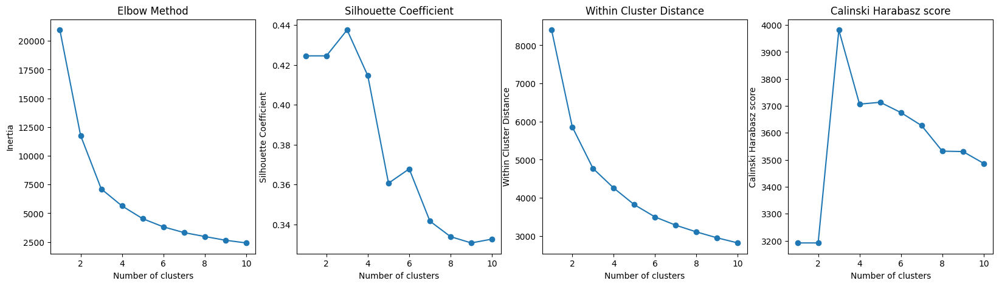

In [133]:
# Check if the 'K-Means Class' column already exists in the 'data6' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data6'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data6' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data6'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data6' dataframe
    del data_dict['data6']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data6' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data6'])

Based on the information provided by the plots, we can make following observations.

The inertia decreases as the number of clusters increases, which is expected since more clusters means smaller within-cluster distances. However, the rate of decrease in inertia appears to decrease after 3 clusters as the number of clusters increases. This suggests that adding more clusters beyond 3 may not be very useful in terms of reducing inertia.

The silhouette score increases up to 3 clusters, but then decreases as the number of clusters increases. This suggests that 3 clusters may be the most optimal number based on this metric.

The within cluster distance decreases as the number of clusters increases, as expected. However, the rate of decrease appears to decrease after 3 clusters again as the number of clusters increases. Even so, this metric alone cannot provide a definitive answer on the most optimal number of clusters.

The Calinski Harabasz score is highest for 3 clusters, which suggests that 3 clusters may be the most optimal number based on this metric.

Overall, based on the available information, it is reasonable to conclude that 3 clusters may be the most optimal number.

In [134]:
# Check if the 'K-Means Class' column already exists in the 'data6' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data6'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data6' dataframe
    data6_opt_inertia, data6_opt_cluster_centers, data6_opt_labels, data_dict['data6'] = k_means_clustering(data_dict['data6'], num_clusters=3)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data6' dataframe
    del data_dict['data6']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data6' dataframe
    data6_opt_inertia, data6_opt_cluster_centers, data6_opt_labels, data_dict['data6'] = k_means_clustering(data_dict['data6'], num_clusters=3)

In [135]:
data_dict['data6']

,X1,X2,Class,K-Means Class
1,1.388261,2.076096,0,2
2,2.177247,3.102304,0,1
3,0.378645,5.307610,0,1
4,3.681732,1.622681,0,2
5,2.462861,2.777897,0,2
...,...,...,...,...
4092,0.909687,0.375763,1,0
4093,2.698381,0.511262,1,2
4094,1.078797,1.526153,1,0
4095,1.974889,-0.649343,1,0


###**Hierarchical Clustering of Data 6**

#####**Dendrogram for Hierarchical Clustering of Data 6**

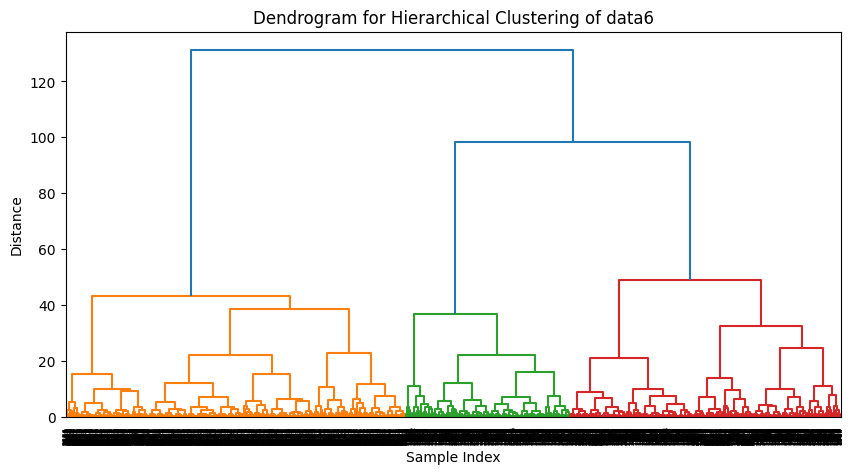

Cophenetic correlation coefficient: 0.6076328917617296


In [137]:
# Extract features
X = data_dict['data6'].iloc[:, 0:2].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data6")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 3 as an optimal number of clusters for this dataset, as shown below:

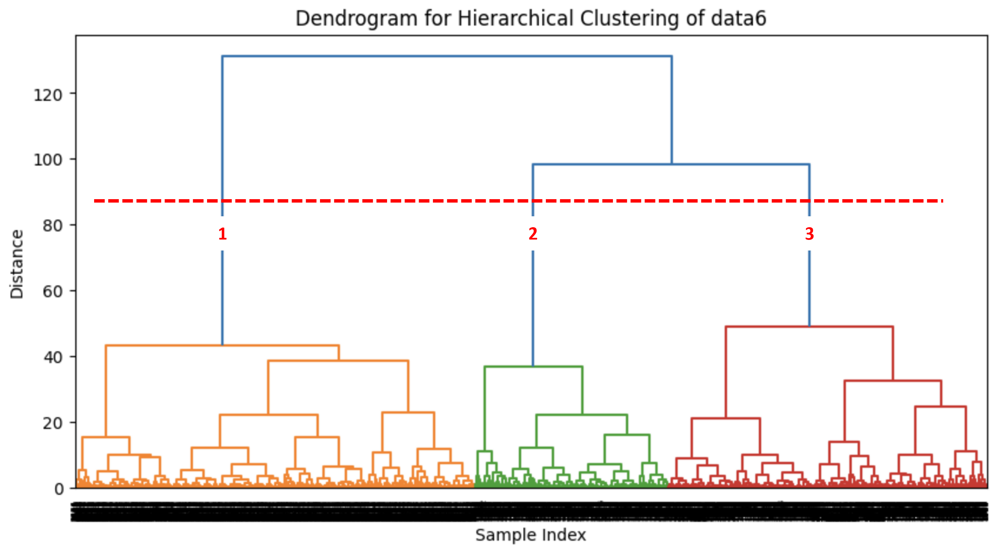

In [138]:
# Check if the 'Hierarchy Class' column already exists in the 'data6' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data6'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data6' dataframe
    _, data_dict['data6'] = hierarchy_clustering(data_dict['data6'], num_clusters = 3)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data6' dataframe
    del data_dict['data6']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data6' dataframe
    _, data_dict['data6'] = hierarchy_clustering(data_dict['data6'], num_clusters = 3)

In [139]:
data_dict['data6']

,X1,X2,Class,K-Means Class,Hierarchy Class
1,1.388261,2.076096,0,2,0
2,2.177247,3.102304,0,1,2
3,0.378645,5.307610,0,1,2
4,3.681732,1.622681,0,2,0
5,2.462861,2.777897,0,2,0
...,...,...,...,...,...
4092,0.909687,0.375763,1,0,1
4093,2.698381,0.511262,1,2,0
4094,1.078797,1.526153,1,0,1
4095,1.974889,-0.649343,1,0,1


###**3D Plot for Data 6 According to the Original Class**

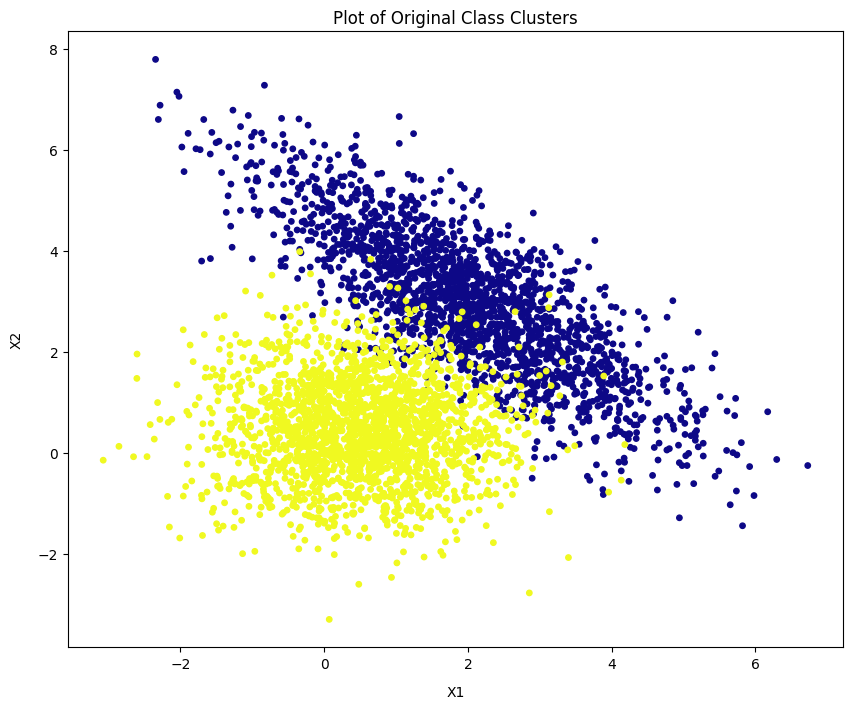

In [140]:
original_graph(data_dict['data6'])

###**3D Plot for Data 6 According to the K-Means Class**

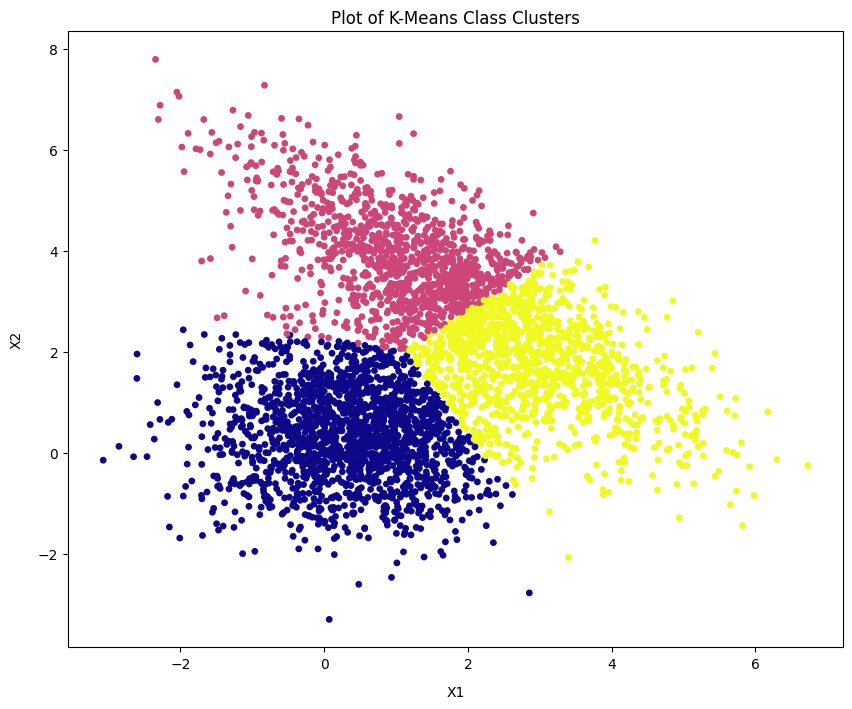

In [141]:
kmean_graph(data_dict['data6'])

###**3D Plot for Data 6 According to the Hierarchical Class**

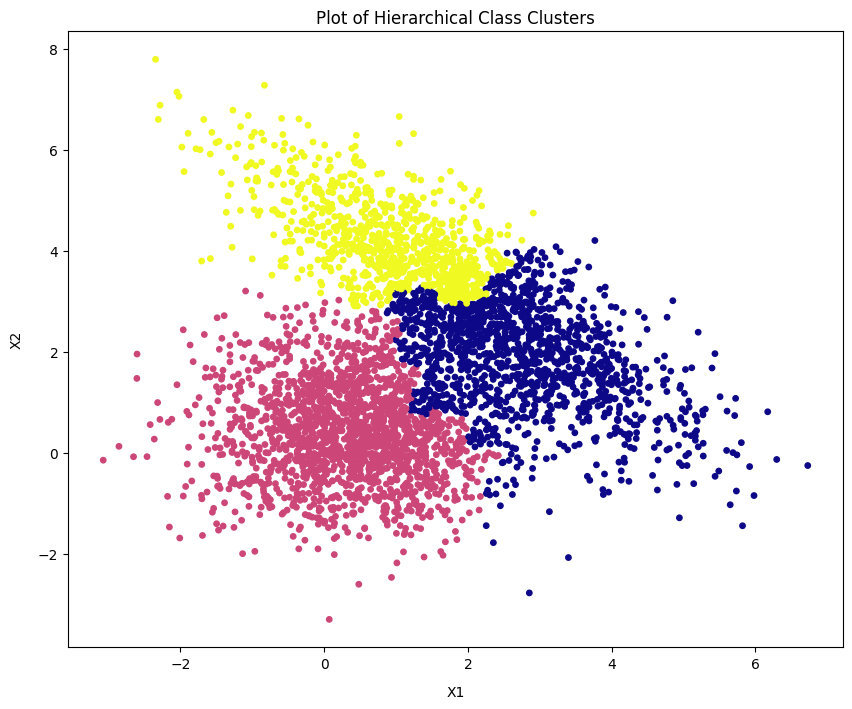

In [298]:
hierarchy_graph(data_dict['data6'])

##**Analysis of Data 7**

In [299]:
data_dict['data7']

,X1,X2,Class
1,-3.000000,-3.000000,4
2,-3.000000,3.000000,3
3,3.000000,-3.000000,5
4,3.000000,3.000000,2
5,-0.417091,0.114782,0
...,...,...,...
766,-1.604434,-1.118861,1
767,-3.050000,-3.050000,4
768,-3.050000,2.950000,3
769,2.950000,-3.050000,5


###**K-Mean Clustering of Data 7**

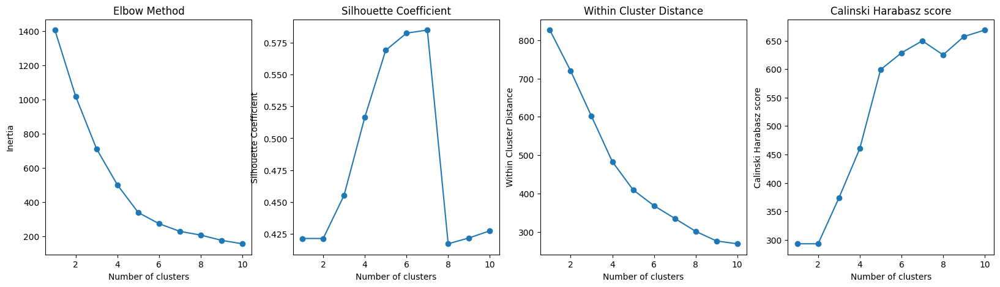

In [300]:
# Check if the 'K-Means Class' column already exists in the 'data7' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data7'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data7' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data7'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data7' dataframe
    del data_dict['data7']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data7' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data7'])

Based on the provided internal validation analysis scores for k-means clustering on a dataset 7, the most optimal number of clusters appears to be 5. This conclusion is based on several criteria, including inertia, silhouette score, within cluster distance, and Calinski Harabasz score. The inertia value decreases as the number of clusters increase, but the decrease becomes less significant after 5 clusters, indicating that 5 clusters might be a good balance between maximizing the decrease in inertia while minimizing the number of clusters used. The silhouette score, which measures the compactness and separation of clusters, is highest for 7 clusters but the increase is not significant after 5 clusters, indicating that the clusters are well-defined at 5 and any additional clustering would lead to overcrowding. The within-cluster distance continues to decrease as the number of clusters increase, but the decrease becomes less significant after 5 clusters, suggesting that this number of clusters strikes a balance between well-defined clusters and minimizing the within-cluster distance. Finally, the Calinski Harabasz score, which measures the ratio of between-cluster variance to within-cluster variance, is relatively very high for 5 clusters. Therefore, based on all of these measures, it appears that 5 clusters is the most optimal number of clusters for this dataset.

In [301]:
# Check if the 'K-Means Class' column already exists in the 'data7' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data7'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data7' dataframe
    data7_opt_inertia, data7_opt_cluster_centers, data7_opt_labels, data_dict['data7'] = k_means_clustering(data_dict['data7'], num_clusters=5)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data7' dataframe
    del data_dict['data7']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data7' dataframe
    data7_opt_inertia, data7_opt_cluster_centers, data7_opt_labels, data_dict['data7'] = k_means_clustering(data_dict['data7'], num_clusters=5)

In [302]:
data_dict['data7']

,X1,X2,Class,K-Means Class
1,-3.000000,-3.000000,4,3
2,-3.000000,3.000000,3,1
3,3.000000,-3.000000,5,0
4,3.000000,3.000000,2,2
5,-0.417091,0.114782,0,4
...,...,...,...,...
766,-1.604434,-1.118861,1,3
767,-3.050000,-3.050000,4,3
768,-3.050000,2.950000,3,1
769,2.950000,-3.050000,5,0


###**Hierarchical Clustering of Data 7**

#####**Dendrogram for Hierarchical Clustering of Data 7**

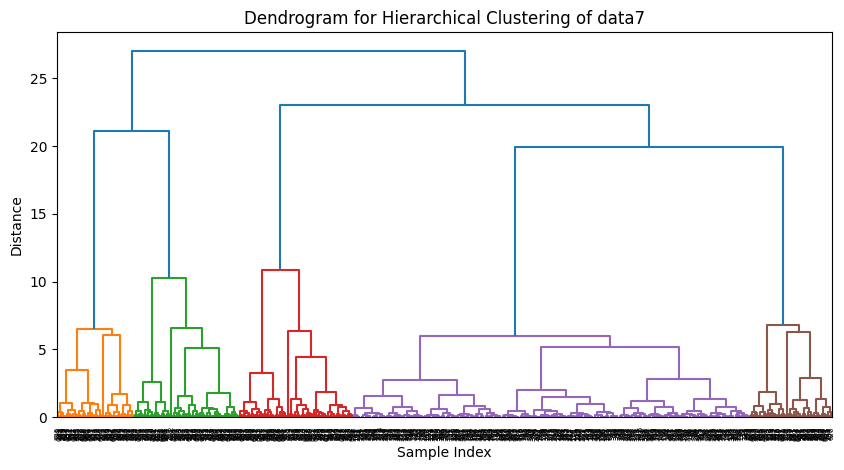

Cophenetic correlation coefficient: 0.7366638099691956


In [303]:
# Extract features
X = data_dict['data7'].iloc[:, 0:2].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data7")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 5 as an optimal number of clusters for this dataset, as shown below:

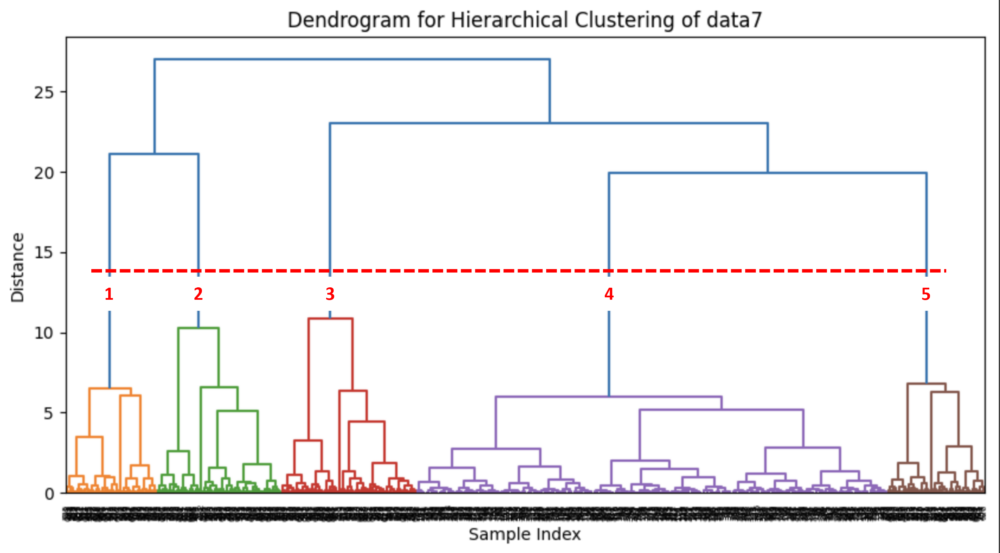

In [304]:
# Check if the 'Hierarchy Class' column already exists in the 'data7' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data7'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data7' dataframe
    _, data_dict['data7'] = hierarchy_clustering(data_dict['data7'], num_clusters = 5)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data7' dataframe
    del data_dict['data7']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data7' dataframe
    _, data_dict['data7'] = hierarchy_clustering(data_dict['data7'], num_clusters = 5)

In [305]:
data_dict['data7']

,X1,X2,Class,K-Means Class,Hierarchy Class
1,-3.000000,-3.000000,4,3,2
2,-3.000000,3.000000,3,1,0
3,3.000000,-3.000000,5,0,1
4,3.000000,3.000000,2,2,3
5,-0.417091,0.114782,0,4,4
...,...,...,...,...,...
766,-1.604434,-1.118861,1,3,2
767,-3.050000,-3.050000,4,3,2
768,-3.050000,2.950000,3,1,0
769,2.950000,-3.050000,5,0,1


###**3D Plot for Data 7 According to the Original Class**

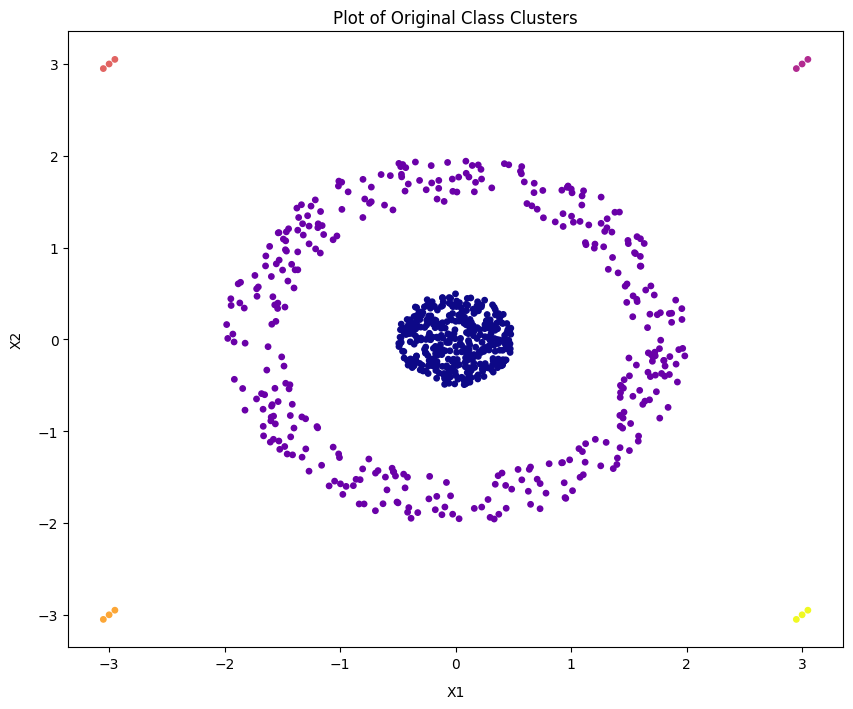

In [306]:
original_graph(data_dict['data7'])

###**3D Plot for Data 7 According to the K-Means Class**

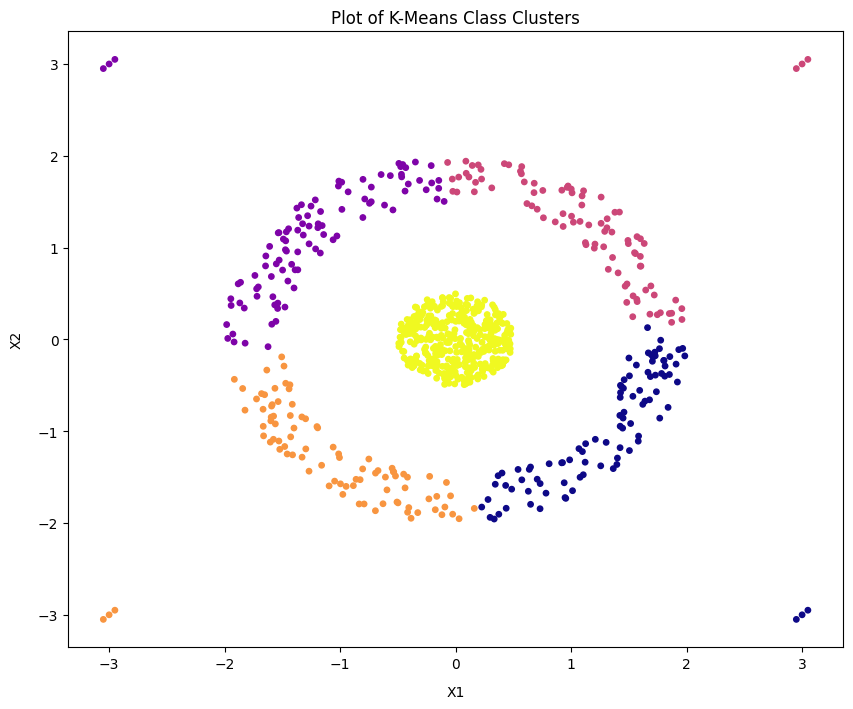

In [307]:
kmean_graph(data_dict['data7'])

###**3D Plot for Data 7 According to the Hierarchical Class**

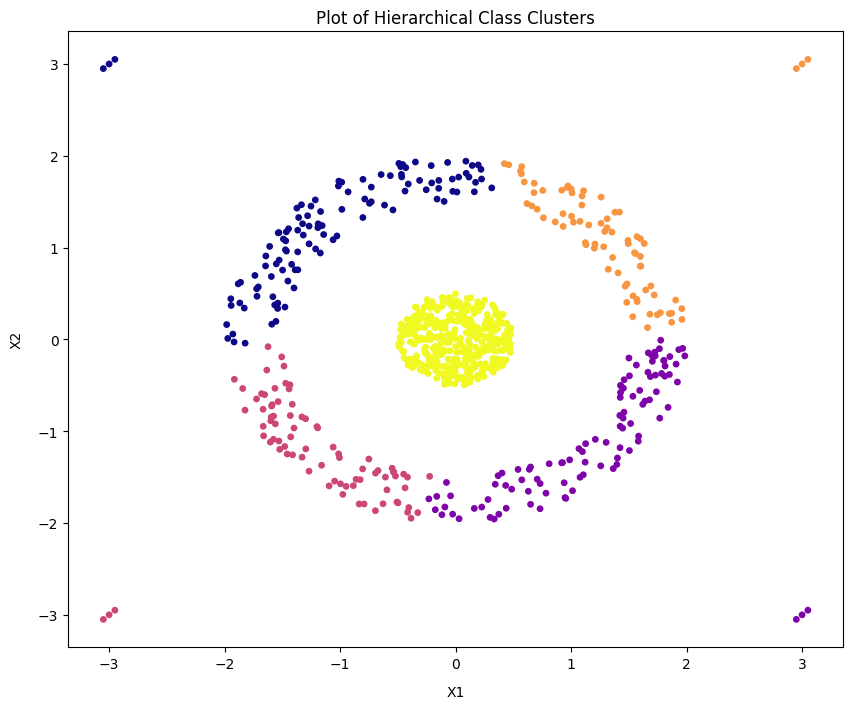

In [308]:
hierarchy_graph(data_dict['data7'])

##**Analysis of Data 8**

In [309]:
data_dict['data8']

,X1,X2,X3,Class
1,0.000000,0.000000,1.00000,0
2,0.000000,0.052336,0.99863,0
3,0.049774,0.016173,0.99863,0
4,0.030762,-0.042341,0.99863,0
5,-0.030762,-0.042341,0.99863,0
...,...,...,...,...
3998,0.049774,-0.016173,-0.99863,0
3999,0.000000,-0.052336,-0.99863,0
4000,-0.049774,-0.016173,-0.99863,0
4001,-0.030762,0.042341,-0.99863,0


###**K-Mean Clustering of Data 8**

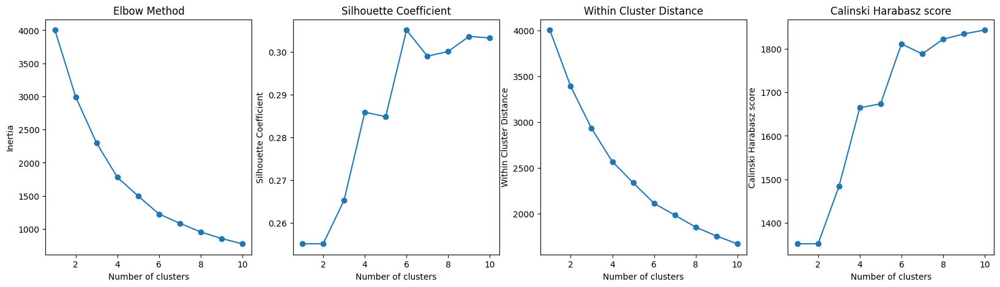

In [310]:
# Check if the 'K-Means Class' column already exists in the 'data8' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data8'].columns:
    # If it does not exist, call the 'k_means_clustering_scores' function to see the internal validation scores for 'data8' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data8'])

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data8' dataframe
    del data_dict['data8']['K-Means Class']
    # Call the 'k_means_clustering_scores' function to see the internal validation scores for 'data8' dataframe for a range of clusters
    k_means_clustering_scores(data_dict['data8'])

Based on the information provided, it is difficult to determine the most optimal number of clusters. However, the Silhouette score and Calinski Harabasz score are the highest for 6 clusters, suggesting that 6 clusters may be the most optimal choice.

On the other hand, the Within Cluster Distance and Inertia decrease as the number of clusters increases. Thus, they do not provide any clear indication of the optimal number of clusters.

Overall, based on the Silhouette Score and Calinski Harabasz Score, it is reasonable to choose 6 clusters as the most optimal number of clusters.

In [324]:
# Check if the 'K-Means Class' column already exists in the 'data8' dataframe of the 'data_dict' dictionary
if 'K-Means Class' not in data_dict['data8'].columns:
    # If it does not exist, call the 'k_means_clustering' function to add the K-Means clustering class to the 'data8' dataframe
    data8_opt_inertia, data8_opt_cluster_centers, data8_opt_labels, data_dict['data8'] = k_means_clustering(data_dict['data8'], num_clusters=6)

else:
    # If it already exists, delete the 'K-Means Class' column from the 'data8' dataframe
    del data_dict['data8']['K-Means Class']
    # Call the 'k_means_clustering' function to add the updated K-Means clustering class to the 'data8' dataframe
    data8_opt_inertia, data8_opt_cluster_centers, data8_opt_labels, data_dict['data8'] = k_means_clustering(data_dict['data8'], num_clusters=6)

In [328]:
data_dict['data8']

,X1,X2,X3,Class,K-Means Class
1,0.000000,0.000000,1.00000,0,4
2,0.000000,0.052336,0.99863,0,4
3,0.049774,0.016173,0.99863,0,4
4,0.030762,-0.042341,0.99863,0,4
5,-0.030762,-0.042341,0.99863,0,4
...,...,...,...,...,...
3998,0.049774,-0.016173,-0.99863,0,5
3999,0.000000,-0.052336,-0.99863,0,5
4000,-0.049774,-0.016173,-0.99863,0,5
4001,-0.030762,0.042341,-0.99863,0,5


###**Hierarchical Clustering of Data 8**

#####**Dendrogram for Hierarchical Clustering of Data 8**

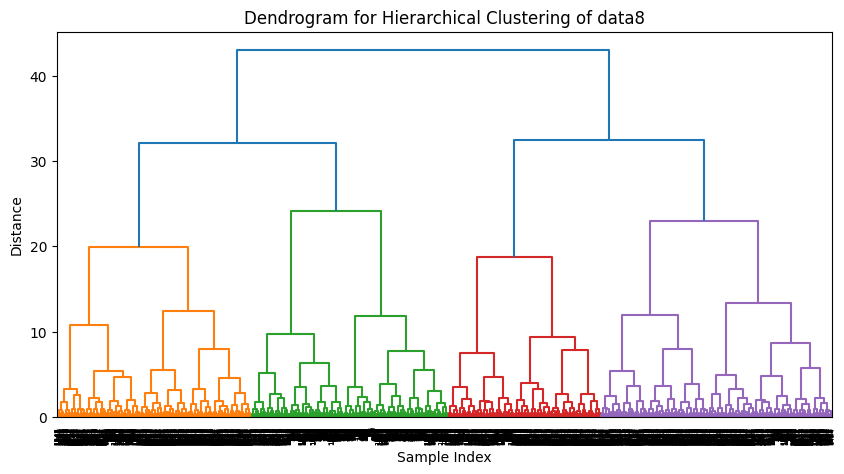

Cophenetic correlation coefficient: 0.5928505558768701


In [334]:
# Extract features
X = data_dict['data8'].iloc[:, 0:3].values

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='ward')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of data8")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 5 as an optimal number of clusters for this dataset, as shown below:

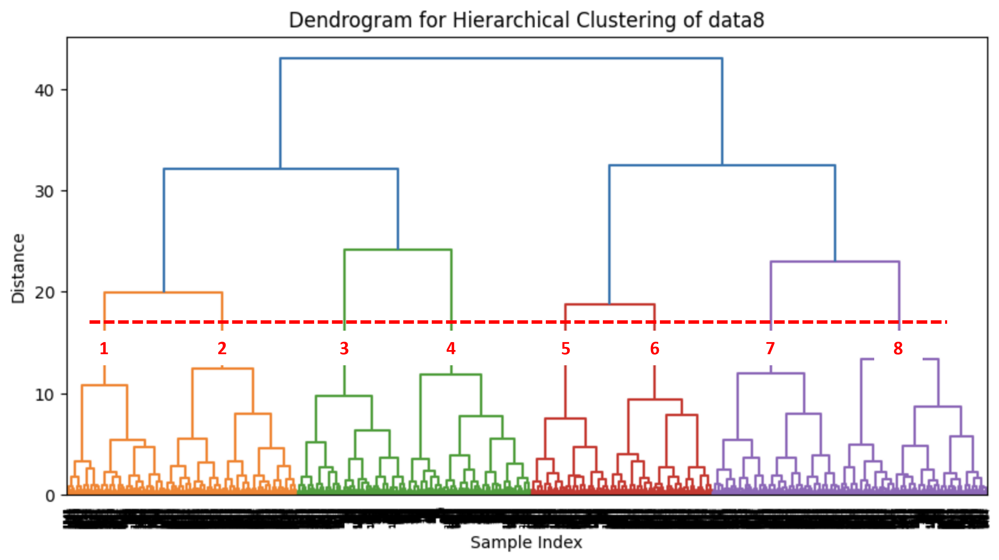

In [335]:
# Check if the 'Hierarchy Class' column already exists in the 'data8' dataframe of the 'data_dict' dictionary
if 'Hierarchy Class' not in data_dict['data8'].columns:
    # If it does not exist, call the 'hierarchy_clustering' function to add the Hierarchical clustering class to the 'data8' dataframe
    _, data_dict['data8'] = hierarchy_clustering(data_dict['data8'], num_clusters = 8)
else:
    # If it already exists, delete the 'Hierarchy Class' column from the 'data8' dataframe
    del data_dict['data8']['Hierarchy Class']
    # Call the 'hierarchy_clustering' function to add the updated Hierarchical clustering class to the 'data8' dataframe
    _, data_dict['data8'] = hierarchy_clustering(data_dict['data8'], num_clusters = 8)

In [336]:
data_dict['data8']

,X1,X2,X3,Class,K-Means Class,Hierarchy Class
1,0.000000,0.000000,1.00000,0,4,1
2,0.000000,0.052336,0.99863,0,4,1
3,0.049774,0.016173,0.99863,0,4,1
4,0.030762,-0.042341,0.99863,0,4,1
5,-0.030762,-0.042341,0.99863,0,4,1
...,...,...,...,...,...,...
3998,0.049774,-0.016173,-0.99863,0,5,3
3999,0.000000,-0.052336,-0.99863,0,5,3
4000,-0.049774,-0.016173,-0.99863,0,5,3
4001,-0.030762,0.042341,-0.99863,0,5,5


###**3D Plot for Data 8 According to the Original Class**

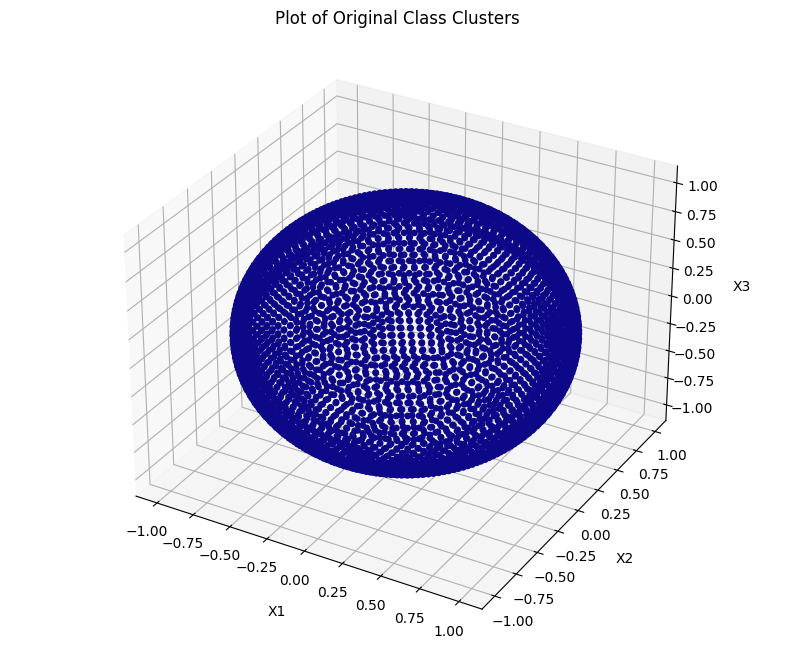

In [331]:
original_graph(data_dict['data8'])

###**3D Plot for Data 8 According to the K-Means Class**

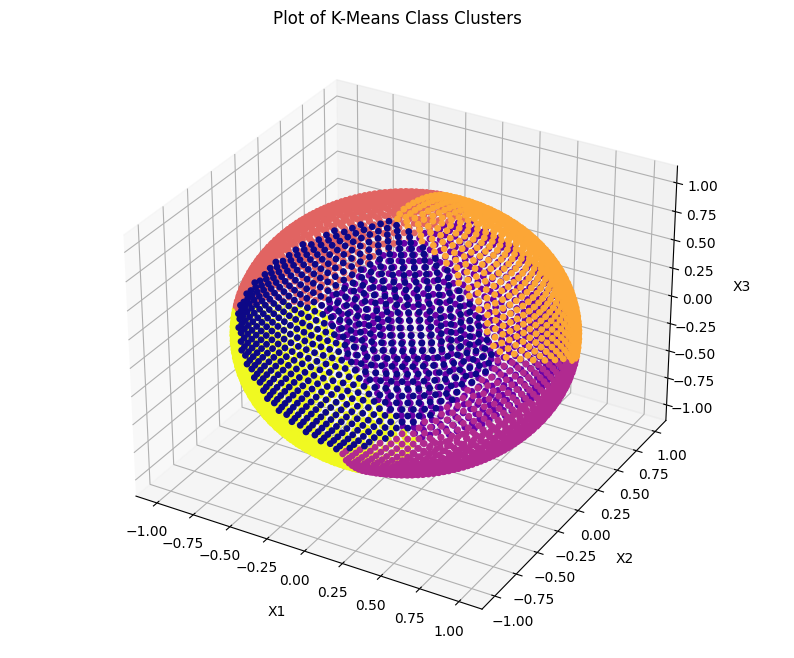

In [332]:
kmean_graph(data_dict['data8'])

###**3D Plot for Data 8 According to the Hierarchical Class**

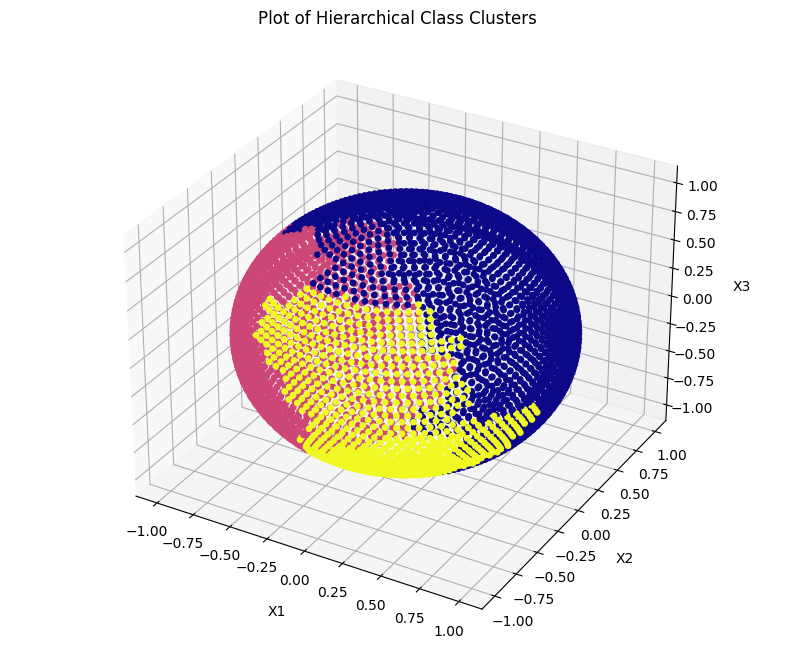

In [333]:
hierarchy_graph(data_dict['data8'])

As is obvious from the above plots, both the clustering algorithms failed to identify the spherical shape of the dataset. Therefore, a better approach for clustering would be to use a density-based clustering method such as DBSCAN that can capture the spherical structures. See below for reference.

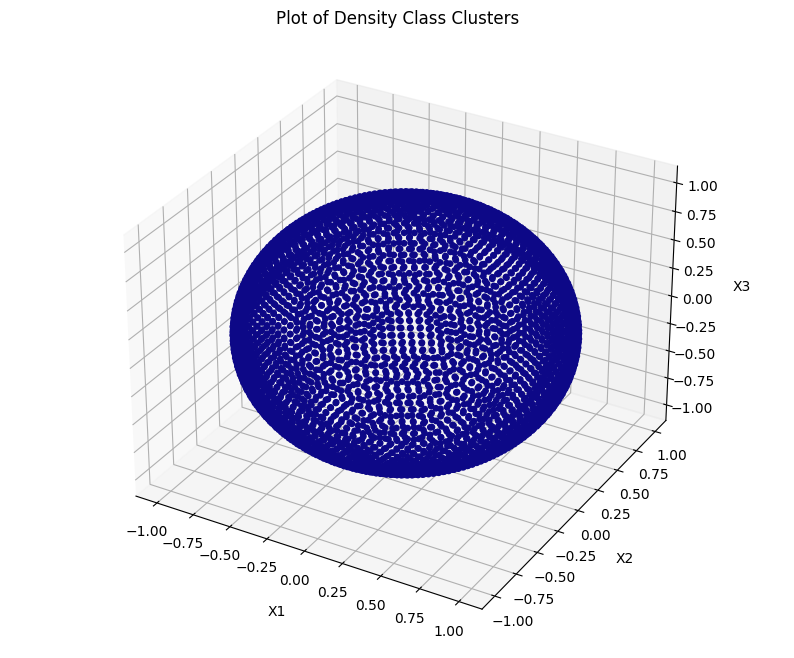

In [342]:
# Load the data from the data_dict dictionary
tempdata8 = np.array(data_dict['data8'].drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis = 1))

# Set the DBSCAN parameters
eps = 0.1  # maximum distance between points in the same cluster
min_samples = 5  # minimum number of points required to form a cluster

# Fit the DBSCAN model to the data
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(tempdata8)

# Get the cluster labels
labels = dbscan.labels_

# Add the cluster labels as a new column to the DataFrame
tempdata8 = pd.DataFrame(tempdata8, columns=['X1', 'X2', 'X3'])
tempdata8['Density Class'] = pd.Series(labels, index=tempdata8.index)

# Extract the X, Y, and Z coordinates and the cluster labels
x = tempdata8.iloc[:, 0]
y = tempdata8.iloc[:, 1]
z = tempdata8.iloc[:, 2]
label = tempdata8.loc[:, 'Density Class']

# Create a figure with a size of 10x8 if ax is not provided and store the figure and axes objects in variables fig and ax respectively
fig, ax = plt.subplots(figsize=(10, 8))

# Remove axis lines and markings for 3D graph
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

# Create a dictionary named 'plot_settings' to store various plot settings
plot_settings = {
   'c': label,
   'cmap': 'plasma',
   'alpha': 1,
   's': 15
 }

ax = fig.add_subplot(projection='3d')
ax.scatter(x, y, z, **plot_settings)
ax.set_xlabel("X1", labelpad=10)
ax.set_ylabel("X2", labelpad=10)
ax.set_zlabel("X3", labelpad=10)
ax.set_title("Plot of Density Class Clusters")

plt.show()

###**PCA Scatter Plot for Data 8 for 2D Comparison of Class Labels**

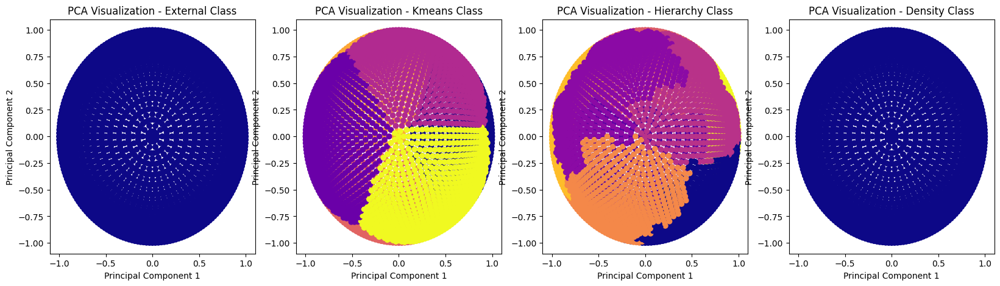

In [344]:
# Load the dataset
datatemp = data_dict['data8']

# Separate the features and labels
X = datatemp.drop(['Class', 'K-Means Class', 'Hierarchy Class'], axis=1)
original_class = datatemp['Class']
hierarchy_class = datatemp['Hierarchy Class']
kmean_class = datatemp['K-Means Class']
density_class = tempdata8['Density Class']

# PCA visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a figure with three subplots arranged horizontally
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# Plot each graph in its corresponding subplot
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=original_class, cmap = 'plasma')
axes[0].set_title('PCA Visualization - External Class')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')

axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=kmean_class, cmap = 'plasma')
axes[1].set_title('PCA Visualization - Kmeans Class')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

axes[2].scatter(X_pca[:, 0], X_pca[:, 1], c=hierarchy_class, cmap = 'plasma')
axes[2].set_title('PCA Visualization - Hierarchy Class')
axes[2].set_xlabel('Principal Component 1')
axes[2].set_ylabel('Principal Component 2')

axes[3].scatter(X_pca[:, 0], X_pca[:, 1], c=density_class, cmap = 'plasma')
axes[3].set_title('PCA Visualization - Density Class')
axes[3].set_xlabel('Principal Component 1')
axes[3].set_ylabel('Principal Component 2')

# Display the figure
plt.show()

##**Task 2**

This task involves analyzing the World Indicators dataset, which compares different countries based on selected attributes. The goal of this project is to group similar countries together using K-means and hierarchical clustering methods, evaluate the quality of the clustering using internal validation metrics, and report the best clustering solution with a detailed list of all the groups and the countries included within the groups.

In addition, this project aims to generate three different scatter plots of choice, such as “Life expectancy vs GDP”, “Infant Mortality vs GDP”, etc., and color the data points according to the group. The visualization of the clustering results will provide insights into the distribution of data points and how well the clustering algorithm performed in assigning data points to their respective clusters.

By analyzing the World Indicators dataset and generating clustering solutions using K-means and hierarchical clustering methods, this project will provide a better understanding of how different countries are similar and dissimilar based on selected attributes and how clustering algorithms can be used to group similar countries together.

In [7]:
if os.path.isfile('World Indicators.csv') != True:
  #uploading data file from user's local machine to the notebook's runtime environment.
  uploaded = files.upload()

  #iterating over the files that have been uploaded and their contents.
  for name, world_indicators in uploaded.items():
    #opening the file in binary mode and detecting its encoding.
    with open(name, 'rb') as f:
      result = chardet.detect(f.read())
    #reading the contents of the file into a DataFrame, using the detected encoding.
    df_world_indic = pd.read_csv(name, encoding=result['encoding'])  

Saving World Indicators (1).csv to World Indicators (1).csv


###**Cleaning Data**

In [8]:
df_world_indic

,Birth Rate,Business Tax Rate,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Region,Country
0,0.025,72.0%,25.0,41852.0,"$199,070,864,638",0.044,$233,451.0,0.023,0.1,0.080,72.0,69.0,0.9,0.272,0.681,0.047,0.682,Africa,Algeria
1,0.046,52.1%,66.0,13576.0,"$104,115,863,405",0.034,$178,282.0,0.107,0.1,0.188,53.0,50.0,0.5,0.477,0.499,0.024,0.409,Africa,Angola
2,0.037,65.9%,29.0,3761.0,"$7,294,900,431",0.045,$34,270.0,0.060,0.0,NaN,60.0,58.0,0.8,0.432,0.539,0.029,0.423,Africa,Benin
3,0.024,19.5%,60.0,2215.0,"$15,292,424,757",0.052,$404,152.0,0.039,0.1,0.110,46.0,47.0,1.5,0.340,0.625,0.035,0.565,Africa,Botswana
4,0.042,43.5%,13.0,NaN,"$10,395,757,480",0.064,$39,270.0,0.068,0.0,NaN,56.0,55.0,0.5,0.458,0.517,0.025,0.265,Africa,Burkina Faso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.907,The Americas,Turks and Caicos Islands
204,0.013,46.5%,5.0,2191193.0,"$15,533,800,000,000",0.177,"$8,467",187.0,0.006,0.7,0.033,81.0,76.0,0.9,0.197,0.669,0.133,0.809,The Americas,United States
205,0.015,41.9%,7.0,4430.0,"$47,236,710,623",0.088,"$1,213",336.0,0.010,0.5,0.098,80.0,73.0,1.4,0.223,0.638,0.139,0.946,The Americas,Uruguay
206,0.020,62.8%,141.0,70198.0,"$316,482,176,579",0.045,$487,864.0,0.014,0.4,0.172,77.0,71.0,1.0,0.291,0.651,0.058,0.888,The Americas,"Venezuela, RB"


In [9]:
df_world_indic.columns

Index(['Birth Rate', 'Business Tax Rate', 'Days to Start Business',
       'Energy Usage', 'GDP', 'Health Exp % GDP', 'Health Exp/Capita',
       'Hours to do Tax', 'Infant Mortality Rate', 'Internet Usage',
       'Lending Interest', 'Life Expectancy Female', 'Life Expectancy Male',
       'Mobile Phone Usage', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Urban', 'Region', 'Country'],
      dtype='object')

In [10]:
df_world_indic.dtypes

Birth Rate                float64
Business Tax Rate          object
Days to Start Business    float64
Energy Usage              float64
GDP                        object
Health Exp % GDP          float64
Health Exp/Capita          object
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Urban          float64
Region                     object
Country                    object
dtype: object

In [11]:
null_counts = df_world_indic.isnull().sum()
print(null_counts)

Birth Rate                 9
Business Tax Rate         27
Days to Start Business    27
Energy Usage              72
GDP                       20
Health Exp % GDP          23
Health Exp/Capita         23
Hours to do Tax           28
Infant Mortality Rate     20
Internet Usage             9
Lending Interest          77
Life Expectancy Female    11
Life Expectancy Male      11
Mobile Phone Usage        12
Population 0-14           17
Population 15-64          17
Population 65+            17
Population Urban           2
Region                     0
Country                    0
dtype: int64


In [12]:
# drop columns with large number of null values
df_world_indic = df_world_indic.drop(["Lending Interest", "Energy Usage"], axis=1)

In [13]:
# Remove percentage, dollar sign, and comma characters from DataFrame elements
def remove_special_chars(x):
    if isinstance(x, str) and ('%' in x or '$' in x or ',' in x):
        x = x.replace('%', '').replace('$', '').replace(',', '')
    return x

# Apply the remove_special_chars function to all elements in the DataFrame
df_world_indic = df_world_indic.applymap(remove_special_chars)

# Drop rows with missing values
df_world_indic = df_world_indic.dropna()

In [14]:
# Convert selected columns to numeric format
numeric_cols = ['Business Tax Rate', 'GDP', 'Health Exp/Capita']
for col in numeric_cols:
    df_world_indic[col] = pd.to_numeric(df_world_indic[col])


In [15]:
# Perform data scaling, temporarily remove the columns that contain string values
df_world_indic_numeric = df_world_indic.drop(["Country", "Region"], axis=1)

In [16]:
df_world_indic_numeric.describe()

,Birth Rate,Business Tax Rate,Days to Start Business,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban
count,171.000000,171.000000,171.000000,1.710000e+02,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000
mean,0.022374,45.159649,30.725146,4.107954e+11,0.067994,1081.900585,283.970760,0.027398,0.361988,72.187135,67.514620,0.950877,0.289199,0.633404,0.077339,0.556497
std,0.010923,36.690978,57.842488,1.460929e+12,0.027527,1874.461060,252.828271,0.025273,0.281205,10.152372,8.875185,0.392484,0.108852,0.071361,0.054458,0.232266
min,0.008000,8.400000,1.000000,1.722537e+08,0.019000,12.000000,12.000000,0.002000,0.000000,45.000000,45.000000,0.000000,0.132000,0.475000,0.003000,0.089000
25%,0.013000,30.550000,9.000000,8.507757e+09,0.049000,85.000000,154.000000,0.007000,0.100000,65.000000,61.500000,0.700000,0.185000,0.578500,0.033000,0.365000
50%,0.020000,39.000000,18.000000,2.904438e+10,0.067000,310.000000,225.000000,0.016000,0.300000,76.000000,69.000000,1.000000,0.284000,0.651000,0.053000,0.553000
75%,0.032000,48.250000,35.500000,2.250653e+11,0.086500,931.500000,333.000000,0.042500,0.600000,79.500000,74.000000,1.200000,0.386000,0.682500,0.118000,0.747000
max,0.050000,339.100000,694.000000,1.553380e+13,0.177000,9908.000000,2600.000000,0.112000,0.900000,86.000000,81.000000,2.000000,0.499000,0.857000,0.237000,1.000000


###**Scaling World Indicators Data**

In [17]:
num_cols = df_world_indic_numeric.shape[1]

In [18]:
# create a MinMaxScaler object to scale the data
scaler = MinMaxScaler()

# transform the data using the scaler and convert it to a DataFrame with the original column names
df_world_indic_scaled = scaler.fit_transform(df_world_indic_numeric.iloc[:, :num_cols])
df_world_indic_scaled = pd.DataFrame(df_world_indic_scaled, columns=df_world_indic_numeric.columns[:num_cols])
 
# show the scaled DataFrame with original column names
df_world_indic_scaled


,Birth Rate,Business Tax Rate,Days to Start Business,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban
0,0.404762,0.192319,0.034632,0.012804,0.158228,0.022332,0.169629,0.190909,0.111111,0.658537,0.666667,0.45,0.381471,0.539267,0.188034,0.650933
1,0.904762,0.132144,0.093795,0.006692,0.094937,0.016774,0.104328,0.954545,0.111111,0.195122,0.138889,0.25,0.940054,0.062827,0.089744,0.351262
2,0.690476,0.173874,0.040404,0.000459,0.164557,0.002223,0.099691,0.527273,0.000000,0.365854,0.361111,0.40,0.817439,0.167539,0.111111,0.366630
3,0.380952,0.033565,0.085137,0.000973,0.208861,0.039612,0.054096,0.336364,0.111111,0.024390,0.055556,0.75,0.566757,0.392670,0.136752,0.522503
4,0.809524,0.106138,0.017316,0.000658,0.284810,0.002728,0.099691,0.600000,0.000000,0.268293,0.277778,0.25,0.888283,0.109948,0.094017,0.193194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,0.238095,0.058966,1.000000,0.000270,0.259494,0.048302,0.072257,0.181818,0.333333,0.707317,0.611111,0.50,0.411444,0.463351,0.264957,0.630077
167,0.166667,0.062594,0.057720,0.001513,0.215190,0.093270,0.076507,0.163636,0.666667,0.682927,0.583333,0.70,0.204360,0.609948,0.350427,0.000000
168,0.119048,0.115210,0.005772,1.000000,1.000000,0.854386,0.067620,0.036364,0.777778,0.878049,0.861111,0.45,0.177112,0.507853,0.555556,0.790340
169,0.166667,0.101300,0.008658,0.003030,0.436709,0.121362,0.125193,0.072727,0.555556,0.853659,0.777778,0.70,0.247956,0.426702,0.581197,0.940724


###**Analysing Inertias and Silhouette Scores**

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7fe182eacf70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 584, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 725, in _make_controller_from_path
    lib_controller = lib_controller_class(
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 810, in __init__
    self._dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.9/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /usr/local/lib/python3.9/dist-packages/scikit_learn.libs/libgomp-a34b3233.so.1.0.0: cannot open shared object file: No such file or directory


Text(0.5, 1.0, 'Silhouette Coefficient')

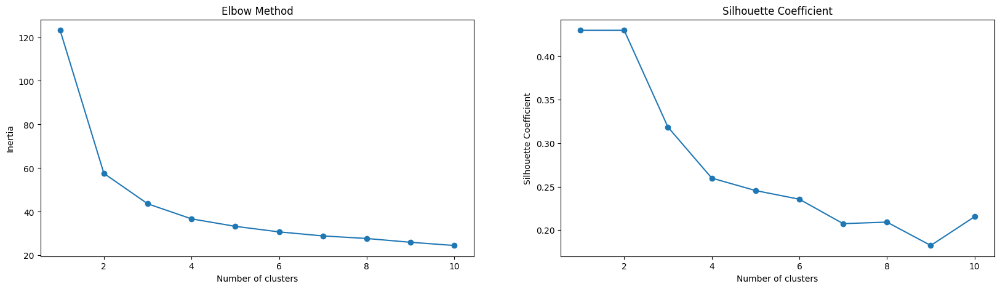

In [19]:
min_clusters = 1
max_clusters = 10
inertias = []
silhouette_scores = []

num_cols = df_world_indic_scaled.shape[1]

# Calculate scores for k=1 separately
kmeans = KMeans(n_clusters=1, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans.fit(df_world_indic_scaled.iloc[:, :num_cols])
wi_inertia = kmeans.inertia_
inertias.append(wi_inertia)

# Silhouette Score can not be calculated for a single cluster
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans.fit(df_world_indic_scaled.iloc[:, :num_cols])
wi_labels = kmeans.labels_
wi_silhouette_score = silhouette_score(df_world_indic_scaled.iloc[:, :num_cols], wi_labels)
silhouette_scores.append(wi_silhouette_score)

for num_clusters in range(2, max_clusters+1):
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_world_indic_scaled.iloc[:, :num_cols])
    wi_labels = kmeans.labels_
    wi_inertia = kmeans.inertia_
    wi_silhouette_score = silhouette_score(df_world_indic_scaled.iloc[:, :num_cols], wi_labels)

    silhouette_scores.append(wi_silhouette_score)
    inertias.append(wi_inertia)
        
# plot elbow method
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
axs[0].plot(range(min_clusters, max_clusters+1), inertias, marker='o')
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('Inertia')
axs[0].set_title('Elbow Method')

# plot silhouette coefficient
axs[1].plot(range(min_clusters, max_clusters+1), silhouette_scores, marker='o')
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('Silhouette Coefficient')
axs[1].set_title('Silhouette Coefficient')

Based on the information given in above plots, the most optimal number of clusters for the k-means clustering algorithm would be 2. This is because the inertia decreases significantly from 1 to 2 clusters, and then the decrease becomes less prominent for each additional cluster. Additionally, the Silhouette score is highest for 2 clusters, indicating that the data points are well-clustered and not too close to the neighboring clusters. The Silhouette score decreases for higher number of clusters, indicating poorer clustering performance.

###**K-Means Clustering of World Indicators Data with 2 Clusters**

In [20]:
num_cols = df_world_indic_scaled.shape[1]

# Create a KMeans object with the specified number of clusters and random_state=0
wi_kmeans = KMeans(n_clusters=2, random_state=0)
        
# Fit the KMeans object to the dataset
wi_kmeans.fit(df_world_indic_scaled.iloc[:, :num_cols])
        
# Compute the inertia, cluster centers, and cluster labels
wi_inertia, wi_clustercenters, wi_labels = wi_kmeans.inertia_, wi_kmeans.cluster_centers_, wi_kmeans.labels_
        
# Add a new column 'K-Means Class' to the world indicator data and assign the obtained labels to it
df_world_indic['K-Means Class'] = wi_labels


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [21]:
df_world_indic

,Birth Rate,Business Tax Rate,Days to Start Business,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Region,Country,K-Means Class
0,0.025,72.0,25.0,199070864638,0.044,233,451.0,0.023,0.1,72.0,69.0,0.9,0.272,0.681,0.047,0.682,Africa,Algeria,0
1,0.046,52.1,66.0,104115863405,0.034,178,282.0,0.107,0.1,53.0,50.0,0.5,0.477,0.499,0.024,0.409,Africa,Angola,0
2,0.037,65.9,29.0,7294900431,0.045,34,270.0,0.060,0.0,60.0,58.0,0.8,0.432,0.539,0.029,0.423,Africa,Benin,0
3,0.024,19.5,60.0,15292424757,0.052,404,152.0,0.039,0.1,46.0,47.0,1.5,0.340,0.625,0.035,0.565,Africa,Botswana,0
4,0.042,43.5,13.0,10395757480,0.064,39,270.0,0.068,0.0,56.0,55.0,0.5,0.458,0.517,0.025,0.265,Africa,Burkina Faso,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,0.018,27.9,694.0,4363219094,0.060,490,199.0,0.022,0.3,74.0,67.0,1.0,0.283,0.652,0.065,0.663,The Americas,Suriname,1
202,0.015,29.1,41.0,23676348287,0.053,935,210.0,0.020,0.6,73.0,66.0,1.4,0.207,0.708,0.085,0.089,The Americas,Trinidad and Tobago,1
204,0.013,46.5,5.0,15533800000000,0.177,8467,187.0,0.006,0.7,81.0,76.0,0.9,0.197,0.669,0.133,0.809,The Americas,United States,1
205,0.015,41.9,7.0,47236710623,0.088,1213,336.0,0.010,0.5,80.0,73.0,1.4,0.223,0.638,0.139,0.946,The Americas,Uruguay,1


###**Dendrogram for Hierarchical Clustering of World Indicators Data**

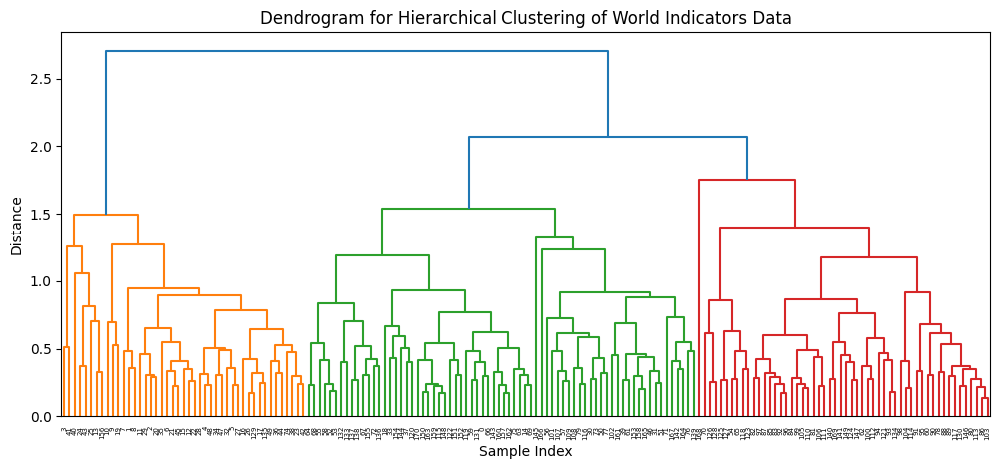

Cophenetic correlation coefficient: 0.6804576419989403


In [22]:
# Extract features
X = df_world_indic_scaled.iloc[:, 0:16]

# Apply hierarchical clustering with Ward's method
Z = linkage(X, method='complete')

# Calculate the cophenetic correlation coefficient
c, coph_dists = cophenet(Z, pdist(X))


# Plot dendrogram
plt.figure(figsize=(12, 5))
dendrogram(Z)
plt.title("Dendrogram for Hierarchical Clustering of World Indicators Data")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Print the cophenetic correlation coefficient
print("Cophenetic correlation coefficient:", c)

In the dendrogram, passing a horizontal line in the middle of the the largest vertical difference between nodes gives us 2 as an optimal number of clusters for this dataset, as shown below:

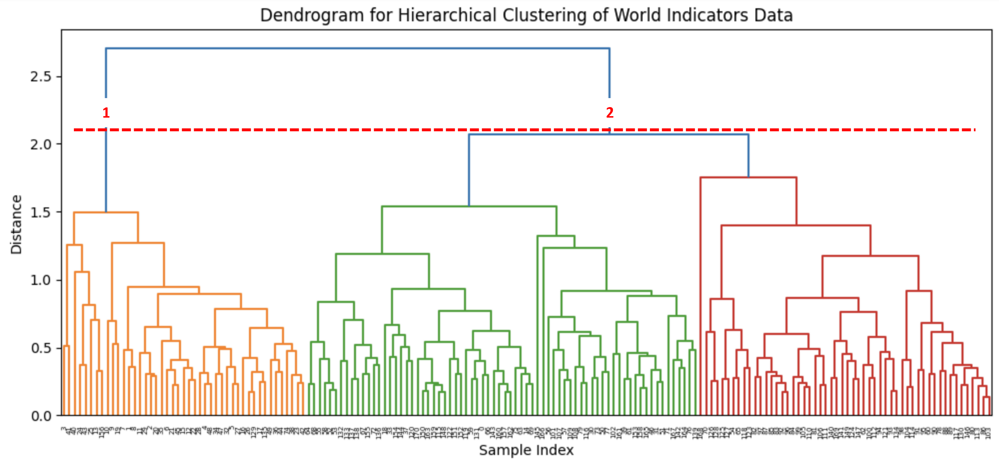

###**Hierarchical Clustering of World Indicators Data with 2 Clusters**

In [23]:
# Create a hierarchical clustering object with the specified number of clusters and linkage='ward'
h_clustering = AgglomerativeClustering(n_clusters=2, linkage='ward')

# Fit the clustering object to the dataset
h_clustering.fit(df_world_indic_scaled.iloc[:, 0:16])

wi_h_labels = h_clustering.labels_

# Add a new column 'Hierarchy Class' to the input data and assign the obtained labels to it
df_world_indic['Hierarchy Class'] = wi_h_labels

In [24]:
df_world_indic

,Birth Rate,Business Tax Rate,Days to Start Business,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,Internet Usage,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Region,Country,K-Means Class,Hierarchy Class
0,0.025,72.0,25.0,199070864638,0.044,233,451.0,0.023,0.1,72.0,69.0,0.9,0.272,0.681,0.047,0.682,Africa,Algeria,0,0
1,0.046,52.1,66.0,104115863405,0.034,178,282.0,0.107,0.1,53.0,50.0,0.5,0.477,0.499,0.024,0.409,Africa,Angola,0,0
2,0.037,65.9,29.0,7294900431,0.045,34,270.0,0.060,0.0,60.0,58.0,0.8,0.432,0.539,0.029,0.423,Africa,Benin,0,0
3,0.024,19.5,60.0,15292424757,0.052,404,152.0,0.039,0.1,46.0,47.0,1.5,0.340,0.625,0.035,0.565,Africa,Botswana,0,0
4,0.042,43.5,13.0,10395757480,0.064,39,270.0,0.068,0.0,56.0,55.0,0.5,0.458,0.517,0.025,0.265,Africa,Burkina Faso,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,0.018,27.9,694.0,4363219094,0.060,490,199.0,0.022,0.3,74.0,67.0,1.0,0.283,0.652,0.065,0.663,The Americas,Suriname,1,0
202,0.015,29.1,41.0,23676348287,0.053,935,210.0,0.020,0.6,73.0,66.0,1.4,0.207,0.708,0.085,0.089,The Americas,Trinidad and Tobago,1,1
204,0.013,46.5,5.0,15533800000000,0.177,8467,187.0,0.006,0.7,81.0,76.0,0.9,0.197,0.669,0.133,0.809,The Americas,United States,1,1
205,0.015,41.9,7.0,47236710623,0.088,1213,336.0,0.010,0.5,80.0,73.0,1.4,0.223,0.638,0.139,0.946,The Americas,Uruguay,1,1


###**Internal Validation Metrics for Cluster Quality**

In [27]:
#Calculate Dunn Score, Calinski Harabasz Score, and Silhouette Score for K-Means Clustering
kmeans_pairwise_dist = pairwise_distances(df_world_indic_scaled.iloc[:,0:16])
kmeans_dunn_score = dunn(kmeans_pairwise_dist,wi_labels)
kmeans_ch_score = metrics.calinski_harabasz_score(df_world_indic_scaled.iloc[:,0:16], wi_labels)
kmeans_silhouette_score = silhouette_score(df_world_indic_scaled.iloc[:, 0:16], wi_labels)
print('Dunn Score for K-Means Clustering: '+ str(kmeans_dunn_score))
print('Calinski Harabasz Score for K-Means Clustering: '+ str(kmeans_ch_score))
print('Silhouette Score for K-Means Clustering: '+ str(kmeans_silhouette_score))

Dunn Score for K-Means Clustering: 0.12192108167876109
Calinski Harabasz Score for K-Means Clustering: 192.54525050508803
Silhouette Score for K-Means Clustering: 0.42987453131766545


In [28]:
#Calculate Dunn Score, Calinski Harabasz Score, and Silhouette Score for Hierarchical Clustering
h_pairwise_dist = pairwise_distances(df_world_indic_scaled.iloc[:,0:16])
h_dunn_score = dunn(h_pairwise_dist,wi_h_labels)
h_ch_score = metrics.calinski_harabasz_score(df_world_indic_scaled.iloc[:,0:16], wi_h_labels)
h_silhouette_score = silhouette_score(df_world_indic_scaled.iloc[:, 0:16], wi_h_labels)
print('Dunn Score for Hierarchical Clustering: '+ str(h_dunn_score))
print('Calinski Harabasz Score for Hierarchical Clustering: '+ str(h_ch_score))
print('Silhouette Score for Hierarchical Clustering: '+ str(h_silhouette_score))

Dunn Score for Hierarchical Clustering: 0.14142629053178704
Calinski Harabasz Score for Hierarchical Clustering: 184.87996192103543
Silhouette Score for Hierarchical Clustering: 0.4176400922367597


The quality of clustering can be evaluated using internal validation metrics like Dunn Score, Calinski Harabasz Score, and Silhouette Score. Based on the scores provided, the k-means clustering and hierarchical clustering have almost similar performance, but k-means clustering has slightly better results.

The Dunn Score for k-means clustering is 0.1219, and for hierarchical clustering, it is 0.1414. A higher Dunn Score indicates better clustering as it measures the distance between clusters. Thus, the hierarchical clustering has a slightly better score, but the difference is not significant.

The Calinski Harabasz Score for k-means clustering is 192.5452, and for hierarchical clustering, it is 184.8799. A higher Calinski Harabasz Score indicates better clustering as it measures the ratio of between-cluster dispersion to within-cluster dispersion. Thus, k-means clustering has a better score and performs better in this metric.

The Silhouette Score for k-means clustering is 0.4298, and for hierarchical clustering, it is 0.4176. A higher Silhouette Score indicates better clustering as it measures the similarity between points in the same cluster compared to other clusters. Thus, k-means clustering has a better score and performs better in this metric.

In summary, both k-means clustering and hierarchical clustering have almost similar performance, but k-means clustering has slightly better results based on the evaluation metrics provided. Therefore, k-means clustering is better for the given dataset.

In [34]:
# Analyzing the countries in cluster 0 during K-Means Clustering operation (Underdeveloped Countries)
df_world_indic[df_world_indic['K-Means Class'] == 0]['Country'].unique()

array(['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Burundi', 'Cameroon', 'Central African Republic', 'Chad',
       'Comoros', 'Congo Dem. Rep.', 'Congo Rep.', "Cote d'Ivoire",
       'Djibouti', 'Equatorial Guinea', 'Eritrea', 'Ethiopia', 'Gabon',
       'Gambia The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya',
       'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
       'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda',
       'Sao Tome and Principe', 'Senegal', 'Sierra Leone', 'South Africa',
       'Sudan', 'Swaziland', 'Tanzania', 'Togo', 'Uganda', 'Zambia',
       'Afghanistan', 'Bangladesh', 'Bhutan', 'Cambodia', 'India',
       'Indonesia', 'Kyrgyz Republic', 'Lao PDR', 'Mongolia', 'Nepal',
       'Pakistan', 'Philippines', 'Tajikistan', 'Timor-Leste',
       'Uzbekistan', 'Iraq', 'Yemen Rep.', 'Kiribati',
       'Micronesia Fed. Sts.', 'Papua New Guinea', 'Solomon Islands',
       'Tonga', 'Vanuatu', 'Belize', 'Bolivia', 'Guatema

In [35]:
# Analyzing the countries in cluster 0 during Hierarchical Clustering operation (Underdeveloped Countries)
df_world_indic[df_world_indic['Hierarchy Class'] == 0]['Country'].unique()

array(['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Burundi', 'Cameroon', 'Central African Republic', 'Chad',
       'Comoros', 'Congo Dem. Rep.', 'Congo Rep.', "Cote d'Ivoire",
       'Djibouti', 'Egypt Arab Rep.', 'Equatorial Guinea', 'Eritrea',
       'Ethiopia', 'Gabon', 'Gambia The', 'Ghana', 'Guinea',
       'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Madagascar',
       'Malawi', 'Mali', 'Mauritania', 'Mozambique', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal',
       'Sierra Leone', 'South Africa', 'Sudan', 'Swaziland', 'Tanzania',
       'Togo', 'Uganda', 'Zambia', 'Afghanistan', 'Bangladesh', 'Bhutan',
       'Cambodia', 'India', 'Indonesia', 'Kyrgyz Republic', 'Lao PDR',
       'Mongolia', 'Nepal', 'Pakistan', 'Philippines', 'Sri Lanka',
       'Tajikistan', 'Timor-Leste', 'Uzbekistan', 'Iran Islamic Rep.',
       'Iraq', 'Jordan', 'Yemen Rep.', 'Fiji', 'Kiribati',
       'Micronesia Fed. Sts.', 'Papua New Guinea

The two clustering methods have some similarities but also differences in the countries they consider as underdeveloped. The K-Means method lists Honduras and Suriname as developed countries, whereas the Hierarchical method includes them in the underdeveloped list.

K-Means lists 75 underdeveloped countries, while Hierarchical lists 83. This difference could be due to the different clustering techniques and parameters used in each method.

It's interesting to note that both methods include some of the most populous countries in the world, such as India, Indonesia, and Nigeria, in their underdeveloped list. It highlights the magnitude of the challenge to develop these nations and to improve the living standards of their large populations.

Overall, clustering methods can provide useful insights into groupings of countries based on indicators such as GDP, life expectancy, education, and others. 

In [38]:
# Analyzing the countries in cluster 1 during K-Means Clustering operation (Developed Countries)
df_world_indic[df_world_indic['K-Means Class'] == 1]['Country'].unique()

array(['Egypt Arab Rep.', 'Mauritius', 'Morocco', 'Seychelles', 'Tunisia',
       'Armenia', 'Azerbaijan', 'Brunei Darussalam', 'China', 'Georgia',
       'Japan', 'Kazakhstan', 'Korea Rep.', 'Malaysia', 'Singapore',
       'Sri Lanka', 'Thailand', 'Vietnam', 'Albania', 'Austria',
       'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria',
       'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia',
       'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland',
       'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
       'Macedonia FYR', 'Malta', 'Moldova', 'Montenegro', 'Netherlands',
       'Norway', 'Poland', 'Portugal', 'Romania', 'Russian Federation',
       'Serbia', 'Slovak Republic', 'Slovenia', 'Spain', 'Sweden',
       'Switzerland', 'Turkey', 'Ukraine', 'United Kingdom', 'Bahrain',
       'Iran Islamic Rep.', 'Israel', 'Jordan', 'Kuwait', 'Lebanon',
       'Oman', 'Qatar', 'Saudi Arabia', 'United Arab Emirates',
       'Australia', 'Fiji', 'Ne

In [39]:
# Analyzing the countries in cluster 1 during Hierarchical Clustering operation (Developed Countries)
df_world_indic[df_world_indic['Hierarchy Class'] == 1]['Country'].unique()

array(['Mauritius', 'Morocco', 'Seychelles', 'Tunisia', 'Armenia',
       'Azerbaijan', 'Brunei Darussalam', 'China', 'Georgia', 'Japan',
       'Kazakhstan', 'Korea Rep.', 'Malaysia', 'Singapore', 'Thailand',
       'Vietnam', 'Albania', 'Austria', 'Belarus', 'Belgium',
       'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
       'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France',
       'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy',
       'Latvia', 'Lithuania', 'Luxembourg', 'Macedonia FYR', 'Malta',
       'Moldova', 'Montenegro', 'Netherlands', 'Norway', 'Poland',
       'Portugal', 'Romania', 'Russian Federation', 'Serbia',
       'Slovak Republic', 'Slovenia', 'Spain', 'Sweden', 'Switzerland',
       'Turkey', 'Ukraine', 'United Kingdom', 'Bahrain', 'Israel',
       'Kuwait', 'Lebanon', 'Oman', 'Qatar', 'Saudi Arabia',
       'United Arab Emirates', 'Australia', 'New Zealand',
       'Antigua and Barbuda', 'Argentina', 'Bahamas The', 'Barbado

##**Scatter Plots**

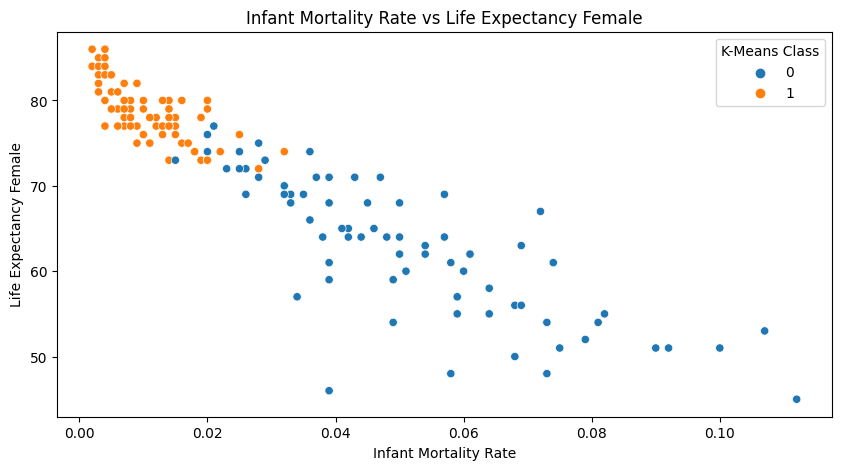

In [45]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='Infant Mortality Rate', y='Life Expectancy Female', data=df_world_indic, hue='K-Means Class')
plt.title("Infant Mortality Rate vs Life Expectancy Female")
plt.show()

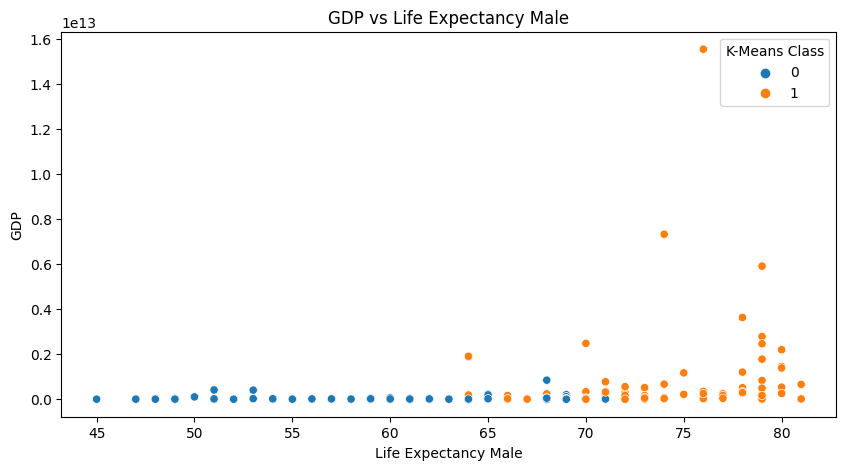

In [44]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='Life Expectancy Male', y='GDP', data=df_world_indic, hue='K-Means Class')
plt.title("GDP vs Life Expectancy Male")
plt.show()

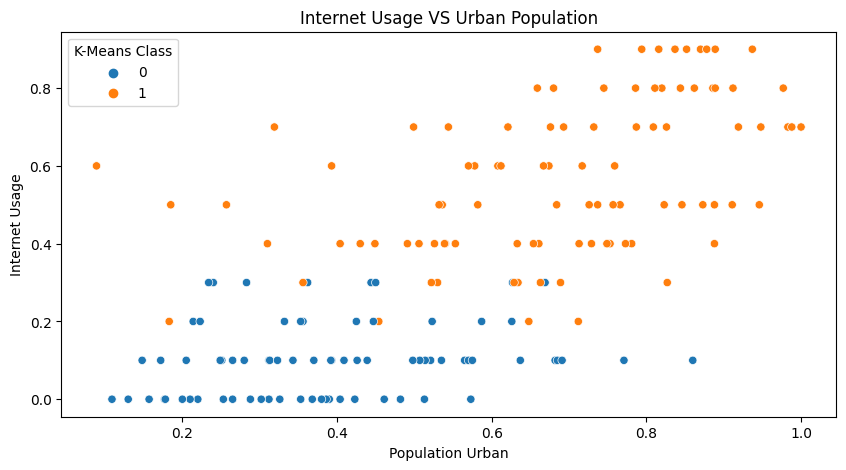

In [43]:
#creating scatter plot based on group 1 and 2.
plt.figure(figsize=(10,5))
sns.scatterplot(x='Population Urban', y='Internet Usage', data=df_world_indic, hue='K-Means Class')
plt.title("Internet Usage VS Urban Population")
plt.show()

In [46]:
!jupyter nbconvert --to html FDA_Project1_Group8_.ipynb

[NbConvertApp] Converting notebook FDA_Project1_Group8_.ipynb to html
[NbConvertApp] Writing 17000207 bytes to FDA_Project1_Group8_.html
